## WEB SCRAPING USING BEAUTIFULSOUP FROM PYTHON LIBRARY

## Whenever we start a Machine Learning project, the first thing we require is a dataset to work on. While there are many sources where datasets are available, we might want to create a dataset using the data found on a website.

## In this notebook, we'll explore the process to extract information from Wikipedia and form a dataset which can later be used for Data Analytics and Machine Learning applications.

## SCRAPING THE LIST OF AIR ACCIDENTS & INCIDENTS DATA FROM WIKIPEDIA

## STEP - I: IMPORTING THE NECESSARY LIBRARIES

In [1]:
import numpy as np
from numpy import median
import pandas as pd
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from sklearn.preprocessing import LabelEncoder

## NUMPY: It's a Python library used for working with arrays, also has functions for working in domain of linear algebra, fourier transform, and matrices. It is an open source project and you can use it freely. NumPy stands for Numerical Python.

## PANDAS: It's a software library written for the Python programming language for data manipulation and analysis. In particular, it offers data structures and operations for manipulating numerical tables and time series.

## REQUESTS: The requests module allows you to send HTTP requests using Python. The HTTP request returns a Response Object with all the response data (content, encoding, status, etc).

## BEAUTIFULSOUP: It's a Python library for pulling data out of HTML and XML files. It works with your favorite parser to provide idiomatic ways of navigating, searching, and modifying the parse tree. It commonly saves programmers hours or days of work.

## MATPLOTLIB: It's a plotting library for the Python programming language and its numerical mathematics extension NumPy. It provides an object-oriented API for embedding plots into applications using general-purpose GUI toolkits like Tkinter, wxPython, Qt, or GTK+..... SciPy makes use of Matplotlib.

## SEABORN: It's a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

## PLOTLY EXPRESS: Plotly Express is a new high-level Python visualization library, is a wrapper for Plotly.py that exposes a simple syntax for complex charts.

## LABELENCODER: LabelEncoder encode labels with a value between 0 and n_classes-1 where n is the number of distinct labels. The categorical values have been converted into numeric values. But depending on the data, label encoding introduces a new problem.

## STEP - II: ACCESSING THE HTML CONTENT FROM WEBPAGE

In [2]:
URL = 'https://en.wikipedia.org/wiki/List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities'

## REQUESTS.GET( ): This method sends a GET request to the specified url.

In [3]:
page = requests.get(URL)

## STATUS CODE: These are issued by a server in response to a client's request made to the server. All HTTP response status codes are separated into five classes or categories. The first digit of the status code defines the class of response, while the last two digits do not have any classifying or categorization role.

In [4]:
page.status_code

200

## PAGE.TEXT: Page content refers to all the information contained in a website. Page content can be displayed as text, links, images, audio, animation or videos among other things. Search engines have a limited ability to recognize images, animation, video and audio.

In [5]:
htmlCode = page.text

In [6]:
htmlCode

'<!DOCTYPE html>\n<html class="client-nojs" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8"/>\n<title>List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia</title>\n<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X-@aSwpAMMMAAWZvZ2gAAAAC","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":999332368,"wgRevisionId":999332368,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"w

## STEP - III: PARSING THE HTML CONTENT

## Firstyly, we defined the function HTML Content, that accepts a url and uses BeautifulSoup library to get the HTML for a webpage.

In [7]:
soup = BeautifulSoup(htmlCode)

In [8]:
soup

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia</title>
<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X-@aSwpAMMMAAWZvZ2gAAAAC","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":999332368,"wgRevisionId":999332368,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCateg

## PRETTIFY: Prettify arranges all the tags in a parse-tree manner with better readability.

In [9]:
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X-@aSwpAMMMAAWZvZ2gAAAAC","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":999332368,"wgRevisionId":999332368,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGrou

## STEP - IV:  EXTRACT THE TABLES FROM THE URL

In [10]:
all_tables = soup.find_all('table')

## STEP - V: SELECT THE REQUIRED TABLE FROM ALL ACQUIRED TABLES

In [11]:
my_table = soup.find('table', {'class':'wikitable sortable'})

## STEP - VI: SCRAPING THE DATA FROM WIKIPEDIA

In [12]:
# Create 5 lists for each column
A1 = []
A2 = []
A3 = []
A4 = []
A5 = []

# Extract data using HTML tags and append to each list
for row1 in my_table.find_all('tr'):
    cells1 = row1.find_all('th')
    if len(cells1)== 5:
        A1.append(cells1[0].find(text = True))
        A2.append(cells1[1].find(text = True))
        A3.append(cells1[2].find(text = True))
        A4.append(cells1[3].find(text = True))
        A5.append(cells1[4].find(text = True))

# Create a zipped list of the above lists
zippedlist1 = list(zip(A1,A2,A3,A4,A5))

# Convert zipped list to a data frame
df1 = pd.DataFrame(zippedlist1)

# Make the first row of the data frame as column headers
headers1 = df1.iloc[0]
df2 = pd.DataFrame(df1.values[1:], columns = headers1)

In [13]:
# Extract headers from remaining columns
headers2 = [a.get_text() for a in my_table.find_all('th',{'rowspan':'2'})]

#Create 8 lists for each column 
B1 = []
B2 = []
B3 = []
B4 = []
B5 = []
B6 = []
B7 = []
B8 = []

# Extract data using HTML tags and append to each list
for row2 in my_table.find_all('tr'):
    cells2 = row2.find_all('td')
    if len(cells2)== 8:
        B1.append(cells2[0].find(text = True))
        B2.append(cells2[1].find(text = True))
        B3.append(cells2[2].find(text = True))
        B4.append(cells2[3].find(text = True))
        B5.append(cells2[4].find(text = True))
        B6.append(cells2[5].find(text = True))
        B7.append(cells2[6].find(text = True))
        B8.append(cells2[7].find(text = True))

# Create a zipped list of all the above lists
zippedlist2 = list(zip(B1, B2, B3, B4, B5, B6, B7, B8))

# Convert zipped list to a data frame
df3 = pd.DataFrame(zippedlist2, columns = headers2)

## STEP - VII: CONCATENATE (JOINING) THE TWO DATAFRAMES ALONG THE COLUMNS

## Axis = 1 --> Code will calculate a mean for each row with numeric values in the DataFrame

In [14]:
DF = pd.concat([df2, df3], axis = 1)

## STEP - VIII: VIEW OF FINAL DATA FRAME

In [15]:
DF

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†\n,INH\n,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,\n,\n,2001-09-11
1,"est. 1,000",9,56,est. 900,†\n,INH\n,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,\n,\n,2001-09-11
2,583,23,560,0,\n,COM\n,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,\n,1977-03-27\n
3,520,15,505,0,\n,COM\n,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,\n,\n,1985-08-12\n
4,349,33,316,0,†\n,COM\n,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,\n,\n,1996-11-12\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,50,5,45,0,†\n,COM\n,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,\n,\n,1956-02-18\n
549,50,9,41,0,†\n,COM\n,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,\n,\n,1952-04-29\n
550,50,6,44,0,†\n,COM\n,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24\n
551,50,5,45,0,†\n,COM\n,United Airlines Flight 610,Douglas DC-6,usco,ENR,\n,\n,1951-06-30\n


## Observation:

There are 552 rows and 13 columns which contains TOTAL NUMBER OF PEOPLE(T),  CREW(C),  PASSENGERS(P),  GROUND(G),  NOTES(N), INCIDENT,  AIRCRAFT,  LOCATION,  PHASE,  AIRPORT,  DISTANCE,  DATE.

## STEP - IX: USING REGULAR EXPRESSIONS TO REMOVE PRE-DEFINED CHARACTER CLASSES

In [16]:
DF = DF.replace('\n','', regex=True)

In [17]:
DF

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
549,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
550,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
551,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30


## STEP - IX: EXPORT DATAFRAME TO EXCEL

In [18]:
DF.to_excel('E:\Aircraft_Accidents.xlsx')

## STEP - X: FILLING THE NULL VALUES (NaN/NA)    --> ( if needed )

In [19]:
DataFrame = DF
DataFrame = DataFrame.fillna(method='pad')
DataFrame

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
549,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
550,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
551,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30


In [20]:
DataFrame.isnull().sum()

Tot                 0
C                   0
P                   0
G                   0
N                   0
T\n                 0
Incident[nb 1]\n    0
Aircraft\n          0
Location\n          0
Phase\n             0
Airport\n           0
Distance\n          0
Date\n              0
dtype: int64

In [21]:
y = len(DataFrame.columns)

In [22]:
y

13

## STEP - XI: ENCODING THE CATEGORICAL FEATURES INTO NUMERICAL VALUES

In [23]:
Data = DataFrame

## LabelEncoder Encode target labels with value between 0 and n_classes-1.

In [24]:
lb_make=LabelEncoder()
for i in range(y):
    Data[DataFrame.columns[i]]=lb_make.fit_transform(Data[DataFrame.columns[i]])
    i+=1
    print('its done')

its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done


In [25]:
Data

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,151,453,3,0,0,466
1,152,25,110,36,3,4,512,150,453,3,0,0,466
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
4,99,18,90,0,3,0,414,138,183,3,0,0,430
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,100,21,98,0,3,0,416,40,246,3,0,0,34
549,100,25,94,0,3,0,375,43,70,3,0,0,25
550,100,22,97,0,3,0,517,198,421,0,149,50,22
551,100,21,98,0,3,0,516,196,422,3,0,0,21


In [26]:
Data.columns

Index(['Tot', 'C', 'P', 'G', 'N', 'T\n', 'Incident[nb 1]\n', 'Aircraft\n',
       'Location\n', 'Phase\n', 'Airport\n', 'Distance\n', 'Date\n'],
      dtype='object')

## STEP - XII: DATA VISUALIZATION

In [27]:
DF.describe()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
count,553,553,553,553,553,553,553,553,553,553,553,553,553
unique,154,34,162,37,4,6,545,340,485,16,227,120,550
top,50,6,55,0,†,COM,Afghanistan Air Force,Tupolev Tu-154M,usnewyne,ENR,,,2001-09-11
freq,24,83,16,485,384,442,3,11,5,250,266,310,3


In [28]:
DF.shape

(553, 13)

In [29]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553 entries, 0 to 552
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Tot              553 non-null    object
 1   C                553 non-null    object
 2   P                553 non-null    object
 3   G                553 non-null    object
 4   N                553 non-null    object
 5   T
               553 non-null    object
 6   Incident[nb 1]
  553 non-null    object
 7   Aircraft
        553 non-null    object
 8   Location
        553 non-null    object
 9   Phase
           553 non-null    object
 10  Airport
         553 non-null    object
 11  Distance
        553 non-null    object
 12  Date
            553 non-null    object
dtypes: object(13)
memory usage: 56.3+ KB


In [30]:
DF.isnull().sum()

Tot                 0
C                   0
P                   0
G                   0
N                   0
T\n                 0
Incident[nb 1]\n    0
Aircraft\n          0
Location\n          0
Phase\n             0
Airport\n           0
Distance\n          0
Date\n              0
dtype: int64

In [31]:
Data.describe()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
count,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000
mean,90.746835,17.640145,90.846293,1.811935,2.130199,0.815552,272.433996,186.830018,243.191682,2.831826,57.699819,25.649186,275.381555
std,44.167225,8.041265,45.402426,6.045186,1.328769,1.745173,157.593300,102.226128,139.518736,2.854998,73.046716,35.850028,158.961601
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54.000000,14.000000,51.000000,0.000000,0.000000,0.000000,136.000000,95.000000,123.000000,0.000000,0.000000,0.000000,138.000000
50%,106.000000,21.000000,105.000000,0.000000,3.000000,0.000000,273.000000,198.000000,242.000000,3.000000,7.000000,0.000000,276.000000
75%,124.000000,23.000000,125.000000,0.000000,3.000000,0.000000,409.000000,276.000000,363.000000,3.000000,114.000000,48.000000,413.000000
max,153.000000,33.000000,161.000000,36.000000,3.000000,5.000000,544.000000,339.000000,484.000000,15.000000,226.000000,119.000000,549.000000


## include = 'all' is provided as an option, the result will include a union of attributes of each type. The includes and excludes parameters, can be used to limit which columns in a DataFrame are analyzed for the output. The parameters are ignored when analyzing a Series & describes a numeric Series.

In [32]:
Data.describe(include = 'all')

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
count,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000,553.000000
mean,90.746835,17.640145,90.846293,1.811935,2.130199,0.815552,272.433996,186.830018,243.191682,2.831826,57.699819,25.649186,275.381555
std,44.167225,8.041265,45.402426,6.045186,1.328769,1.745173,157.593300,102.226128,139.518736,2.854998,73.046716,35.850028,158.961601
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54.000000,14.000000,51.000000,0.000000,0.000000,0.000000,136.000000,95.000000,123.000000,0.000000,0.000000,0.000000,138.000000
50%,106.000000,21.000000,105.000000,0.000000,3.000000,0.000000,273.000000,198.000000,242.000000,3.000000,7.000000,0.000000,276.000000
75%,124.000000,23.000000,125.000000,0.000000,3.000000,0.000000,409.000000,276.000000,363.000000,3.000000,114.000000,48.000000,413.000000
max,153.000000,33.000000,161.000000,36.000000,3.000000,5.000000,544.000000,339.000000,484.000000,15.000000,226.000000,119.000000,549.000000


## info( ) function: This is used to print a concise summary of a DataFrame. This method prints information about a DataFrame including the index dtype and column dtypes, non-null values and memory usage of the entire data.

In [33]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553 entries, 0 to 552
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Tot              553 non-null    int32
 1   C                553 non-null    int32
 2   P                553 non-null    int32
 3   G                553 non-null    int32
 4   N                553 non-null    int32
 5   T
               553 non-null    int32
 6   Incident[nb 1]
  553 non-null    int32
 7   Aircraft
        553 non-null    int32
 8   Location
        553 non-null    int32
 9   Phase
           553 non-null    int32
 10  Airport
         553 non-null    int32
 11  Distance
        553 non-null    int32
 12  Date
            553 non-null    int32
dtypes: int32(13)
memory usage: 28.2 KB


## value_counts( ): Return a Series containing counts of unique rows in the DataFrame.

In [34]:
Data['P'].value_counts()

109    16
103    14
100    13
106    13
98     12
       ..
38      1
82      1
83      1
84      1
161     1
Name: P, Length: 162, dtype: int64

In [35]:
Data['C'].value_counts()

22    83
23    69
21    66
24    61
19    52
25    44
3     31
2     28
17    25
4     18
12    14
6     13
0      7
1      7
5      6
7      5
15     3
11     3
8      2
10     2
9      1
33     1
13     1
14     1
32     1
18     1
20     1
26     1
27     1
28     1
29     1
30     1
31     1
16     1
Name: C, dtype: int64

In [36]:
Data['Tot'].value_counts()

100    24
102    17
104    14
109    13
113    12
       ..
74      1
75      1
152     1
77      1
76      1
Name: Tot, Length: 154, dtype: int64

In [37]:
Data['Aircraft\n'].value_counts()

322    11
195    10
285    10
242     9
198     8
       ..
190     1
188     1
185     1
183     1
0       1
Name: Aircraft\n, Length: 340, dtype: int64

In [38]:
Data['Incident[nb 1]\n'].value_counts()

75     3
287    2
543    2
309    2
443    2
      ..
368    1
369    1
370    1
371    1
0      1
Name: Incident[nb 1]\n, Length: 545, dtype: int64

In [39]:
Data['Airport\n'].value_counts()

0      266
1        4
88       4
124      3
199      3
      ... 
120      1
196      1
118      1
117      1
226      1
Name: Airport\n, Length: 227, dtype: int64

## FINDING THE MAXIMUM NUMBER OF PASSENGERS

In [40]:
print("Maximum: ", Data["P"].max())

Maximum:  161


## FINDING THE MAXIMUM & MINIMUM TYPE OF INCIDENT 

In [41]:
print("Maximum: ", Data["T\n"].max())
print("Minimum: ", Data["T\n"].min())

Maximum:  5
Minimum:  0


## FINDING THE MAXIMUM & MINIMUM INCIDENT

In [42]:
print("Maximum: ", Data["Incident[nb 1]\n"].max())
print("Minimum: ", Data["Incident[nb 1]\n"].min())

Maximum:  544
Minimum:  0


## FINDING THE MAXIMUM & MINIMUM AIRCRAFT DATA

In [43]:
Data[Data['Aircraft\n'] == Data['Aircraft\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
401,115,24,109,0,3,0,521,339,188,0,21,28,89


In [44]:
Data[Data['Aircraft\n'] == Data['Aircraft\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
478,105,21,102,0,3,0,480,0,95,3,0,0,533


## FINDING THE MAXIMUM & MINIMUM INCIDENT DATA

In [45]:
Data[Data['Incident[nb 1]\n'] == Data['Incident[nb 1]\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
123,26,3,17,0,0,0,544,243,380,0,46,37,227


In [46]:
Data[Data['Incident[nb 1]\n'] == Data['Incident[nb 1]\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
383,118,3,109,0,3,5,0,216,163,8,0,0,32


## FINDING THE MAXIMUM & MINIMUM LOCATION DATA

In [47]:
Data[Data['Location\n'] == Data['Location\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
257,137,19,136,0,3,5,495,217,484,3,0,0,112


In [48]:
Data[Data['Location\n'] == Data['Location\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
508,102,22,99,0,3,3,175,198,0,3,0,0,108


## loc[ ] function: The loc property is used to access a group of rows and columns by label(s) or a boolean array. It's primarily label based, but may also be used with a boolean array.

In [49]:
Data.loc[Data.P > 100, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,151,453,3,0,0,466
1,152,25,110,36,3,4,512,150,453,3,0,0,466
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
37,69,22,113,6,3,4,132,148,463,3,0,0,466
...,...,...,...,...,...,...,...,...,...,...,...,...,...
502,102,17,102,0,3,1,434,167,368,0,98,119,409
507,102,19,101,0,3,0,60,31,402,0,217,101,174
512,102,17,102,0,0,0,479,198,138,0,29,56,35
514,102,0,106,0,0,0,378,195,458,3,0,0,24


In [50]:
Data.loc[Data.P < 50, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
20,84,12,0,13,0,0,77,36,126,5,146,11,419
55,58,4,49,0,3,0,366,4,261,0,105,48,382
58,56,23,49,0,3,0,270,15,193,3,0,0,530
59,56,23,49,0,1,0,122,73,229,3,0,0,169
60,55,24,48,0,3,0,536,289,474,3,0,0,490
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,109,21,0,23,3,0,298,229,113,3,0,0,3
491,104,19,0,19,3,0,72,209,132,10,211,0,308
500,104,1,0,22,3,5,412,185,113,3,0,0,2
511,102,23,30,16,3,5,493,174,168,3,0,0,61


In [51]:
Data.loc[Data.C > 20, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
1,152,25,110,36,3,4,512,150,453,3,0,0,466
14,89,25,83,20,3,0,131,6,447,3,0,0,469
19,85,24,81,0,3,0,138,280,80,5,224,41,324
28,77,23,74,0,3,3,345,20,260,3,0,0,534
33,72,25,67,0,3,0,49,321,473,3,0,0,317
...,...,...,...,...,...,...,...,...,...,...,...,...,...
546,100,23,96,0,3,0,383,258,66,3,0,0,84
548,100,21,98,0,3,0,416,40,246,3,0,0,34
549,100,25,94,0,3,0,375,43,70,3,0,0,25
550,100,22,97,0,3,0,517,198,421,0,149,50,22


In [52]:
Data.loc[Data.C < 20, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,151,453,3,0,0,466
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
4,99,18,90,0,3,0,414,138,183,3,0,0,430
5,98,3,91,0,3,0,485,273,149,3,0,0,212
...,...,...,...,...,...,...,...,...,...,...,...,...,...
534,100,4,92,0,1,0,525,49,118,0,2,38,334
536,100,17,100,0,0,0,433,274,365,10,8,8,297
539,100,19,99,0,3,0,362,298,176,0,108,40,244
547,100,19,99,0,3,0,177,327,464,3,0,0,52


In [53]:
Data.loc[Data.P > 120, : 'Location\n']

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n
0,153,3,136,35,3,4,127,151,453
73,50,2,129,28,3,0,529,285,476
83,45,21,149,19,0,0,338,103,203
153,13,6,153,0,3,0,469,9,262
176,8,2,152,0,3,0,191,240,87
...,...,...,...,...,...,...,...,...,...
367,120,12,121,0,0,0,139,128,353
426,112,30,158,0,3,5,246,294,161
481,105,31,159,0,3,5,224,26,144
490,104,32,160,0,0,1,158,34,20


In [54]:
Data.loc[Data.P < 100, : 'Aircraft\n']

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n
4,99,18,90,0,3,0,414,138
5,98,3,91,0,3,0,485,273
6,97,14,89,0,3,3,99,141
7,96,6,88,0,3,0,415,260
8,95,7,87,0,3,1,333,156
...,...,...,...,...,...,...,...,...
547,100,19,99,0,3,0,177,327
548,100,21,98,0,3,0,416,40
549,100,25,94,0,3,0,375,43
550,100,22,97,0,3,0,517,198


In [55]:
Data.loc[(Data.P > 150) & (Data.C > 20), ['Tot']]

,Tot
183,7
186,6
187,5
188,4
189,4
190,4
196,2
204,151
288,132
334,125


In [56]:
Data.loc[(Data.P < 150) & (Data.C > 10), ['T\n']]

,T\n
1,4
2,0
4,0
6,3
13,2
...,...
548,0
549,0
550,0
551,0


## iloc[ ] function: It returns a Pandas Series when one row is selected, and a Pandas DataFrame when multiple rows are selected, or if any column in full is selected. To counter this, pass a single-valued list if you require DataFrame output.

In [57]:
Data.iloc[2]

Tot                 110
C                    15
P                   111
G                     0
N                     0
T\n                   0
Incident[nb 1]\n    374
Aircraft\n          135
Location\n          359
Phase\n              12
Airport\n           199
Distance\n            0
Date\n              249
Name: 2, dtype: int32

In [58]:
Data.iloc[55, 7]

4

In [59]:
Data.iloc[390, :]

Tot                 117
C                    12
P                   118
G                     0
N                     0
T\n                   0
Incident[nb 1]\n    129
Aircraft\n          269
Location\n          453
Phase\n               0
Airport\n           113
Distance\n           23
Date\n               49
Name: 390, dtype: int32

In [60]:
Data.iloc[[2, 3, 6]]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
6,97,14,89,0,3,3,99,141,41,3,0,0,316


In [61]:
Data.iloc[[2, 3, 6],[1, 2, 3]]

,C,P,G
2,15,111,0
3,7,104,0
6,14,89,0


In [62]:
Data.iloc[[2, 3, 6], :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
6,97,14,89,0,3,3,99,141,41,3,0,0,316


In [63]:
Data.iloc[3:5]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
3,103,7,104,0,0,0,295,146,233,3,0,0,320
4,99,18,90,0,3,0,414,138,183,3,0,0,430


In [64]:
Data.iloc[:, 4]

0      3
1      3
2      0
3      0
4      3
      ..
548    3
549    3
550    3
551    3
552    3
Name: N, Length: 553, dtype: int32

In [65]:
Data.iloc[:, 2:4]

,P,G
0,136,35
1,110,36
2,111,0
3,104,0
4,90,0
...,...,...
548,98,0
549,94,0
550,97,0
551,98,0


In [66]:
Data.iloc[500]

Tot                 104
C                     1
P                     0
G                    22
N                     3
T\n                   5
Incident[nb 1]\n    412
Aircraft\n          185
Location\n          113
Phase\n               3
Airport\n             0
Distance\n            0
Date\n                2
Name: 500, dtype: int32

## groupby( ) function: It is used to split the data into groups based on some criteria. Pandas objects can be split on any of their axes. The abstract definition of grouping is to provide a mapping of labels to group names.

In [67]:
new_df = Data.groupby('Incident[nb 1]\n')
new_df.first()

,Tot,C,P,G,N,T\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
Incident[nb 1],,,,,,,,,,,,
0,118,3,109,0,3,5,216,163,8,0,0,32
1,148,19,147,0,0,0,111,265,5,3,96,499
2,41,2,33,0,3,0,82,267,0,119,77,429
3,108,21,106,0,3,0,34,29,3,0,0,464
4,2,22,150,0,3,0,123,202,3,0,0,500
...,...,...,...,...,...,...,...,...,...,...,...,...
540,109,22,106,0,3,5,26,15,3,0,0,377
541,47,3,39,0,1,0,10,116,0,75,111,512
542,128,22,125,0,0,0,239,348,0,26,23,235


In [68]:
new_df.groups.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

## MEAN: It is used to calculate mean/average of a given list of numbers. It returns mean of the data set passed as parameters.

In [69]:
Data.mean()

Tot                  90.746835
C                    17.640145
P                    90.846293
G                     1.811935
N                     2.130199
T\n                   0.815552
Incident[nb 1]\n    272.433996
Aircraft\n          186.830018
Location\n          243.191682
Phase\n               2.831826
Airport\n            57.699819
Distance\n           25.649186
Date\n              275.381555
dtype: float64

## MEDIAN: It is the middle number in a sorted, ascending or descending, list of numbers and can be more descriptive of that data set than the average. If there is an odd amount of numbers, the median value is the number that is in the middle, with the same amount of numbers below and above.

In [70]:
Data.median()

Tot                 106.0
C                    21.0
P                   105.0
G                     0.0
N                     3.0
T\n                   0.0
Incident[nb 1]\n    273.0
Aircraft\n          198.0
Location\n          242.0
Phase\n               3.0
Airport\n             7.0
Distance\n            0.0
Date\n              276.0
dtype: float64

## STANDARD DEVIATION: A quantity expressing by how much the members of a group differ from the mean value for the group.

In [71]:
Data.std()

Tot                  44.167225
C                     8.041265
P                    45.402426
G                     6.045186
N                     1.328769
T\n                   1.745173
Incident[nb 1]\n    157.593300
Aircraft\n          102.226128
Location\n          139.518736
Phase\n               2.854998
Airport\n            73.046716
Distance\n           35.850028
Date\n              158.961601
dtype: float64

## VARIANCE: It is the expectation of the squared deviation of a random variable from its mean. Informally, it measures how far a set of numbers is spread out from their average value.

In [72]:
Data.var()

Tot                  1950.743763
C                      64.661936
P                    2061.380317
G                      36.544278
N                       1.765626
T\n                     3.045627
Incident[nb 1]\n    24835.648262
Aircraft\n          10450.181199
Location\n          19465.477684
Phase\n                 8.151014
Airport\n            5335.822772
Distance\n           1285.224533
Date\n              25268.790746
dtype: float64

In [73]:
Data.max()

Tot                 153
C                    33
P                   161
G                    36
N                     3
T\n                   5
Incident[nb 1]\n    544
Aircraft\n          339
Location\n          484
Phase\n              15
Airport\n           226
Distance\n          119
Date\n              549
dtype: int32

## GETTING THE TOP 5 & LAST 5 DATA

In [74]:
Data.head()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,151,453,3,0,0,466
1,152,25,110,36,3,4,512,150,453,3,0,0,466
2,110,15,111,0,0,0,374,135,359,12,199,0,249
3,103,7,104,0,0,0,295,146,233,3,0,0,320
4,99,18,90,0,3,0,414,138,183,3,0,0,430


In [75]:
Data.tail()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
548,100,21,98,0,3,0,416,40,246,3,0,0,34
549,100,25,94,0,3,0,375,43,70,3,0,0,25
550,100,22,97,0,3,0,517,198,421,0,149,50,22
551,100,21,98,0,3,0,516,196,422,3,0,0,21
552,100,17,100,0,3,0,387,189,470,3,0,0,10


## CONVERTING THE DATA INTO EXCEL FORMAT

In [76]:
Data.to_excel('E:\Aircraft_Accidents.xlsx')

## CONVERTING THE DATA INTO CSV (COMMA SEPERATED VALUE) FORMAT

In [77]:
Data.to_csv('E:\Aircraft_Accidents.csv')

## STEP - XIII: PLOTTING THE DATA STORED IN DATAFRAME

## MATPLOTLIB: It's a Python plotting package that makes it simple to create two-dimensional plots from data stored in a variety of data structures including lists, numpy arrays, and pandas dataframes.This means that plots can be built step-by-step by adding new elements to the plot.

## PLOTLY: It allows users to stream data to be analyzed and visualized.

## PLOTLY EXPRESS: It provides more than 30 functions for creating different types of figures. The API for these functions was carefully designed to be as consistent and easy to learn as possible, making it easy to switch from a scatter plot to a bar chart to a histogram to a sunburst chart throughout a data exploration session.

## SEABORN: It's a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

In [78]:
A = DF.head()
A

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12


In [79]:
B = DF.tail()
B

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
548,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
549,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
550,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
551,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30
552,50,3,47,0,†,COM,Pennsylvania Central Airlines Flight 410,Douglas C-54 Skymaster,uswess,ENR,,,1947-06-13


## HISTOGRAM - UNIVARIATE ANALYSIS : Representation of the distribution of numerical data, where the data are binned and the count for each bin is represented. In plotly it is an aggregated bar chart, with several possible aggregation functions where the x-axis denotes the number of bins while the y-axis represents the frequency of a particular bin.

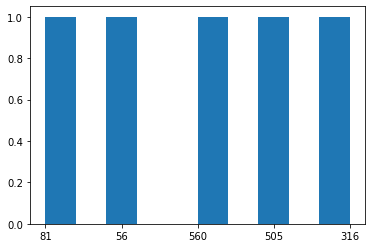

In [80]:
plt.hist(A['P'])
plt.show()

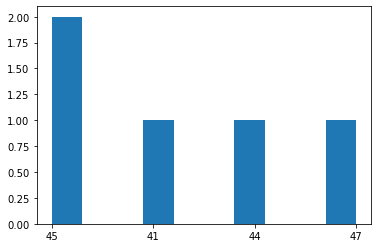

In [81]:
plt.hist(B['P'])
plt.show()

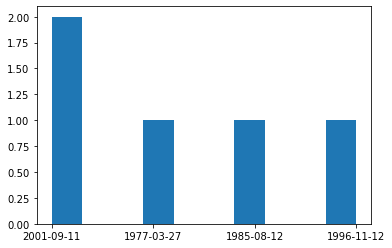

In [82]:
plt.hist(A['Date\n'])
plt.show()

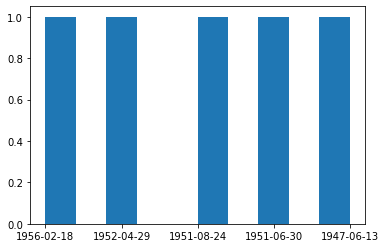

In [83]:
plt.hist(B['Date\n'])
plt.show()

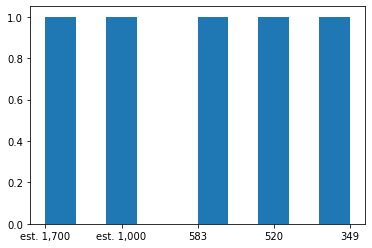

In [84]:
A = DF.head()
plt.hist(A['Tot'])
plt.show()

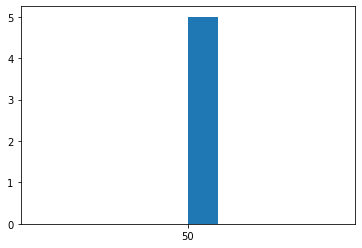

In [85]:
B = DF.tail()
plt.hist(B['Tot'])
plt.show()

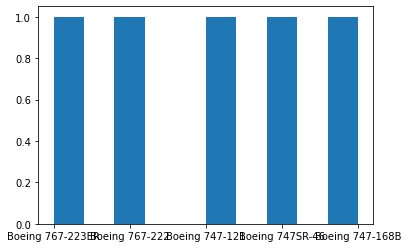

In [86]:
A = DF.head()
plt.hist(A['Aircraft\n'])
plt.show()

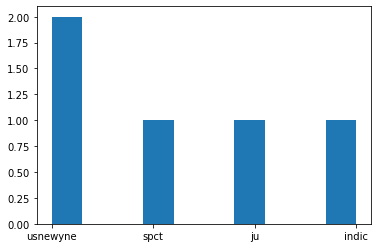

In [87]:
A = DF.head()
plt.hist(A['Location\n'])
plt.show()

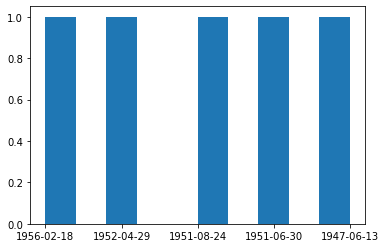

In [88]:
A = DF.tail()
plt.hist(A['Date\n'])
plt.show()

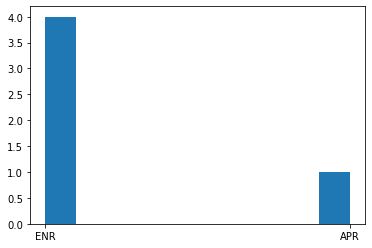

In [89]:
plt.hist(A['Phase\n'])
plt.show()

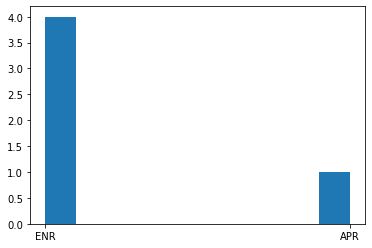

In [90]:
plt.hist(B['Phase\n'])
plt.show()

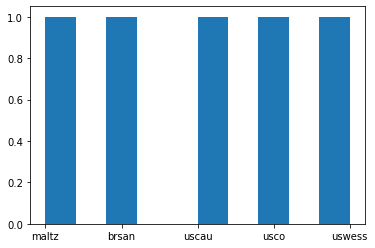

In [91]:
plt.hist(A['Location\n'])
plt.show()

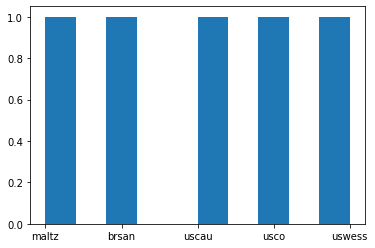

In [92]:
plt.hist(B['Location\n'])
plt.show()

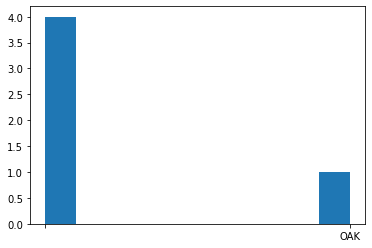

In [93]:
plt.hist(A['Airport\n'])
plt.show()

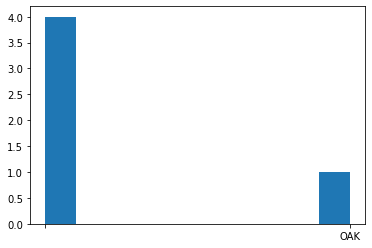

In [94]:
plt.hist(B['Airport\n'])
plt.show()

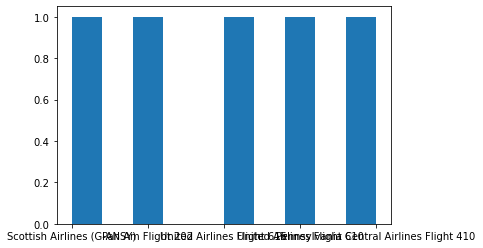

In [95]:
plt.hist(A['Incident[nb 1]\n'])
plt.show()

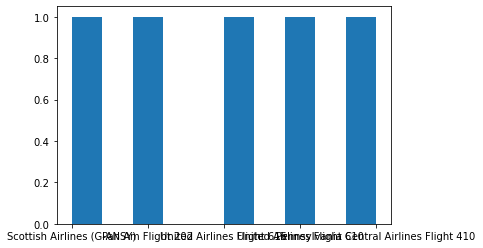

In [96]:
plt.hist(B['Incident[nb 1]\n'])
plt.show()

## OBSERVATION: 

Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C) were dead by Hijacking(T: INH) on En Route(Phase) on 11-09-2001(Date) at New York City, US(Location). 

## Observation of Histogram:

1. Creating a histogram provides a visual representation of data distribution.

2. Histograms can display a large amount of data and the frequency of the data values where the median and distribution of the data can be determined. In addition, it can show any outliers or gaps in the data.

3. To select a "neat" number of bins and "neat" mid-point values for the data. You may over-ride this selection and set your own bin specifications when prompted.


## DISTPLOT: Seaborn distplot lets you show a histogram with a line on it. We use seaborn in combination with matplotlib, the Python plotting module. It plots a UNIVARIATE distribution of observations. The distplot() function combines the matplotlib hist function with the seaborn kdeplot() and rugplot() functions.

## KDE PLOT: kernel density estimation (KDE) is a non-parametric way to estimate the probability density function of a random variable. Kernel density estimation is a fundamental data smoothing problem where inferences about the population are made, based on a finite data sample and Show a univariate or bivariate distribution.

## RUG PLOT: A rug plot is a plot of data for a single quantitative variable, displayed as marks along an axis. It is used to visualise the distribution of the data. As such it is analogous to a histogram with zero-width bins, or a one-dimensional scatter plot. Draws a small vertical lines to show each observation in a distribution.

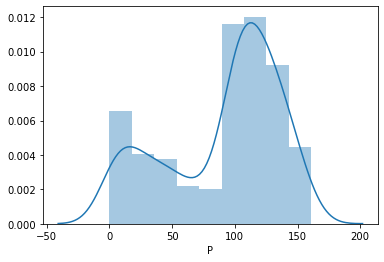

In [97]:
# by default-> sns.distplot(x, hist=True, kde=True)
sns.distplot(Data['P'])

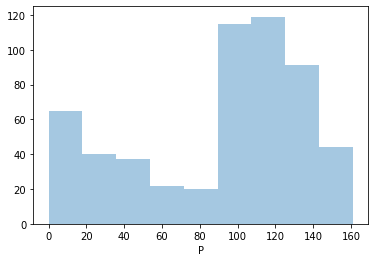

In [98]:
sns.distplot(Data['P'], kde = False, rug = False)

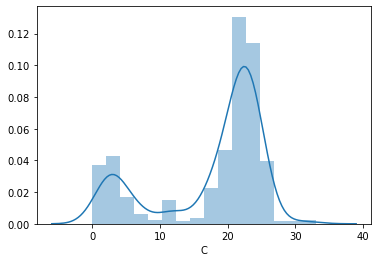

In [99]:
# by default-> sns.distplot(x, hist=True, kde=True)
sns.distplot(Data['C'])

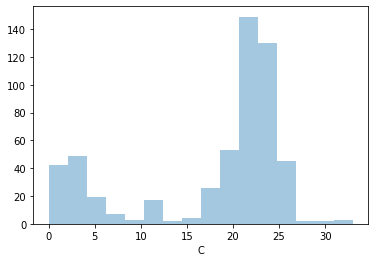

In [100]:
sns.distplot(Data['C'], kde = False, rug = False)

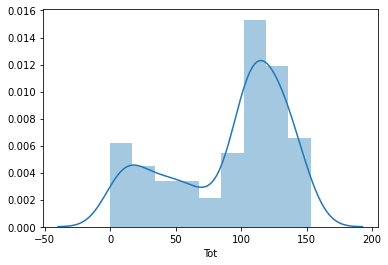

In [101]:
sns.distplot(Data['Tot'])

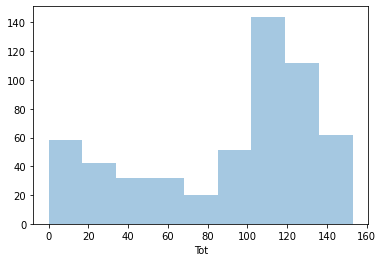

In [102]:
sns.distplot(Data['Tot'], kde = False, rug = False)

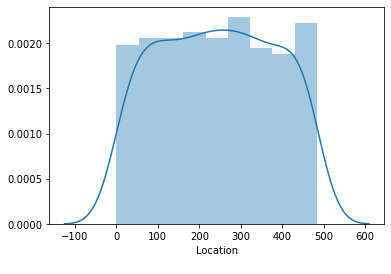

In [103]:
sns.distplot(Data['Location\n'])

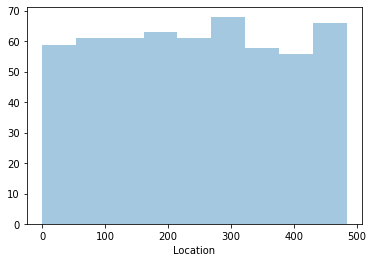

In [104]:
sns.distplot(Data['Location\n'], kde = False, rug = False)

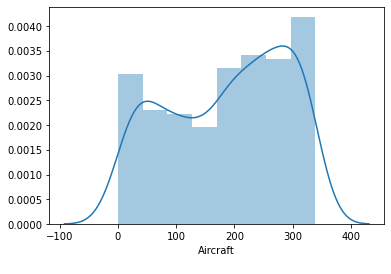

In [105]:
sns.distplot(Data['Aircraft\n'])

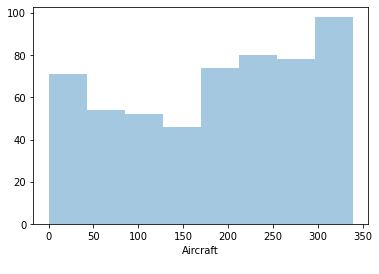

In [106]:
sns.distplot(Data['Aircraft\n'], kde = False, rug = False)

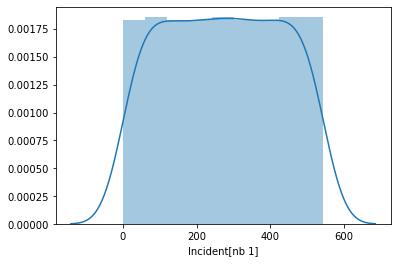

In [107]:
sns.distplot(Data['Incident[nb 1]\n'])

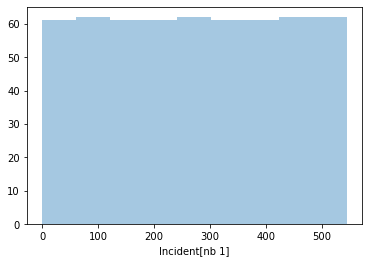

In [108]:
sns.distplot(Data['Incident[nb 1]\n'], kde = False, rug = False)

C:\Users\admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


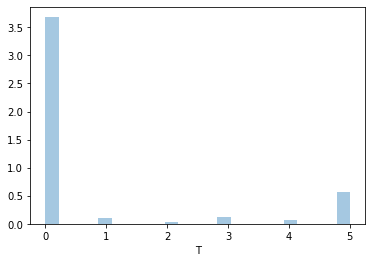

In [109]:
sns.distplot(Data['T\n'])

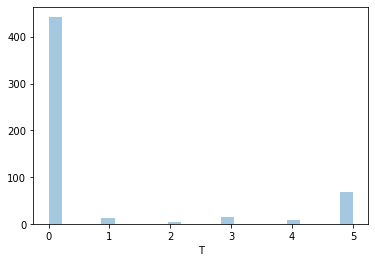

In [110]:
sns.distplot(Data['T\n'], kde = False, rug = False)

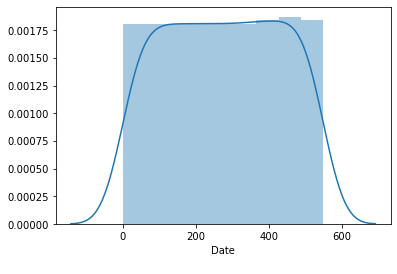

In [111]:
sns.distplot(Data['Date\n'])

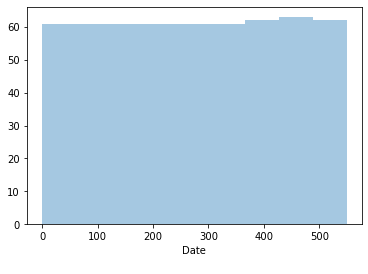

In [112]:
sns.distplot(Data['Date\n'], kde = False, rug = False)

## OBSERVATION: 

Incident is high with Air France Flight, Aircraft:-Boeing 727-230: 43 Passengers(P), 10 Crew(C) were dead by Commercial (T: accident/incident) on En Route(Phase) on 20-4-1998(Date) at Monserrate Mtn, Bogota, Colombia(Location). 

## Observation of Dist Plot:

1. It's a figure-level function with a similar flexibility over the kind of plot to draw.

2. It's basically for univariant set of observations and visualizes it through a histogram i.e. only one observation and hence we choose one particular column of the dataset.

3. The plot shows a simple distribution when it creats a random values with random.randn().

## BOXPLOT - UNIVARIATE ANALYSYS: A Boxplot is a very basic plot - measure of how well the distribution of data in a DataFrame. It's very useful when you want to compare data between two groups. Sometimes a boxplot is named a box-and-whisker plot. Any box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution where it divides the data set into three quartiles representing the minimum, maximum, median, first quartile and third quartile in the DataFrame.

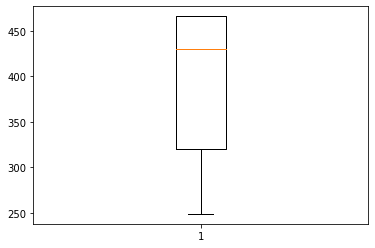

In [113]:
A = Data.head()
plt.boxplot(A['Date\n'])
plt.show()

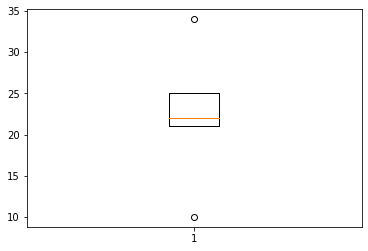

In [114]:
B = Data.tail()
plt.boxplot(B['Date\n'])
plt.show()

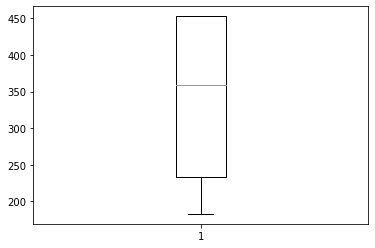

In [115]:
A = Data.head()
plt.boxplot(A['Location\n'])
plt.show()

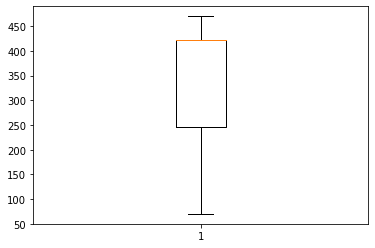

In [116]:
B = Data.tail()
plt.boxplot(B['Location\n'])
plt.show()

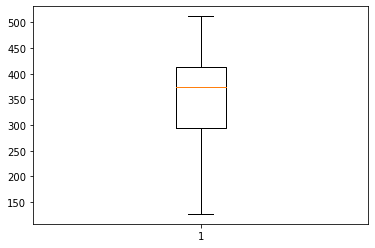

In [117]:
A = Data.head()
plt.boxplot(A['Incident[nb 1]\n'])
plt.show()

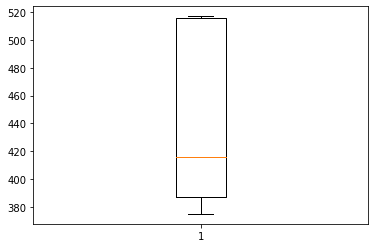

In [118]:
B = Data.tail()
plt.boxplot(B['Incident[nb 1]\n'])
plt.show()

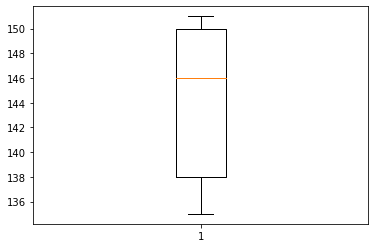

In [119]:
A = Data.head()
plt.boxplot(A['Aircraft\n'])
plt.show()

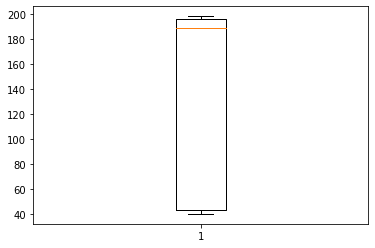

In [120]:
B = Data.tail()
plt.boxplot(B['Aircraft\n'])
plt.show()

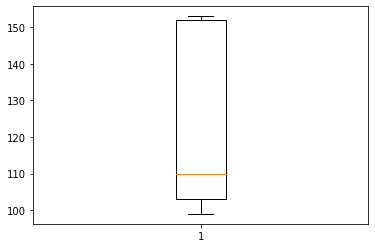

In [121]:
A = Data.head()
plt.boxplot(A['Tot'])
plt.show()

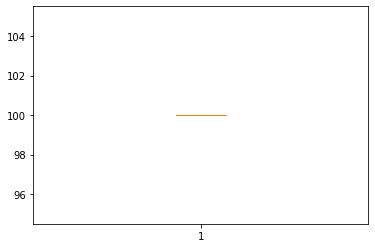

In [122]:
B = Data.tail()
plt.boxplot(B['Tot'])
plt.show()

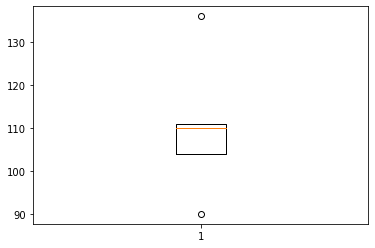

In [123]:
A = Data.head()
plt.boxplot(A['P'])
plt.show()

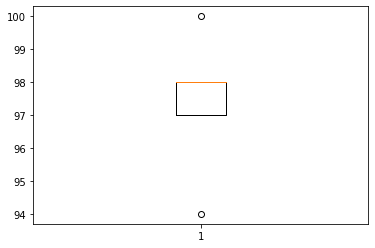

In [124]:
B = Data.tail()
plt.boxplot(B['P'])
plt.show()

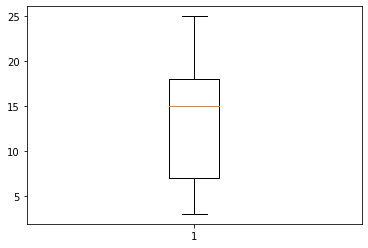

In [125]:
A = Data.head()
plt.boxplot(A['C'])
plt.show()

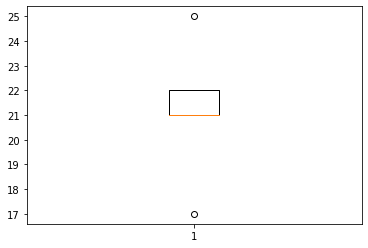

In [126]:
B = Data.tail()
plt.boxplot(B['C'])
plt.show()

## OBSERVATION: 

Incident is high with Trigana Air Flight 267, Aircraft:- ATR 42-300: 49 Passengers(P), 5 Crew(C) were dead by Commercial (T: accident/incident) on En Route(Phase) on 16-8-2015(Date) at Mount Tangok, Pegunungan Bintang Regency, Papua, Indonesia(Location).

## Seaborn Boxplots are used to visualize distributions. Thats very useful when you want to compare data between two groups. Sometimes named as box-and-whisker plot. Any box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution.

## BOX PLOT - BIVARIATE ANALYSIS

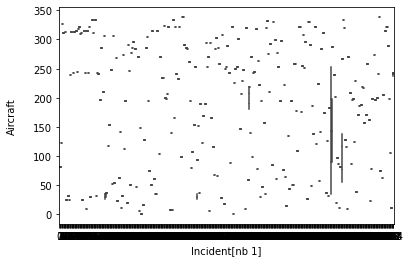

In [127]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = Data)

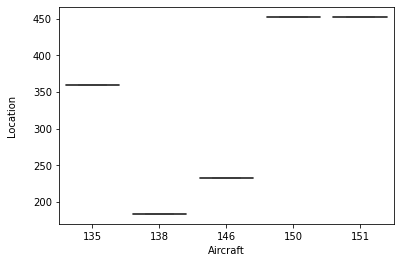

In [128]:
sns.boxplot(x = 'Aircraft\n', y = 'Location\n', data = A)

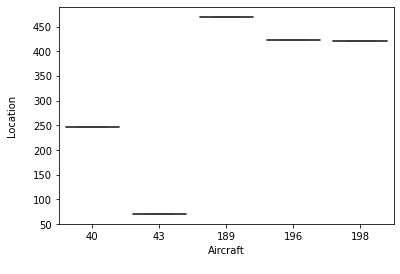

In [129]:
sns.boxplot(x = 'Aircraft\n', y = 'Location\n', data = B)

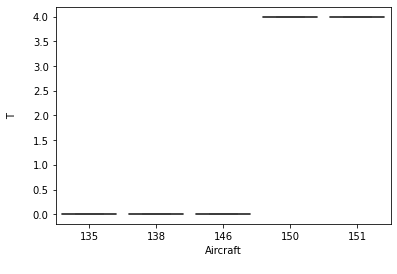

In [130]:
sns.boxplot(x = 'Aircraft\n', y = 'T\n', data = A)

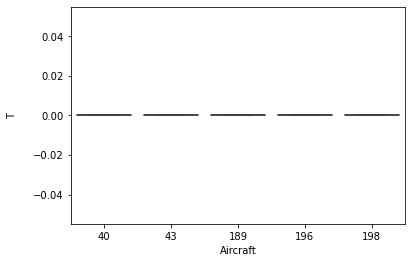

In [131]:
sns.boxplot(x = 'Aircraft\n', y = 'T\n', data = B)

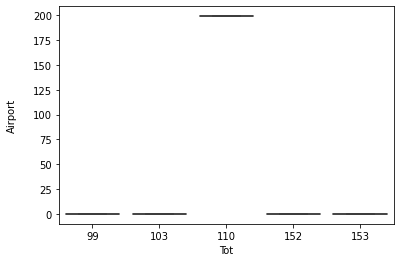

In [132]:
sns.boxplot(x = 'Tot', y = 'Airport\n', data = A)

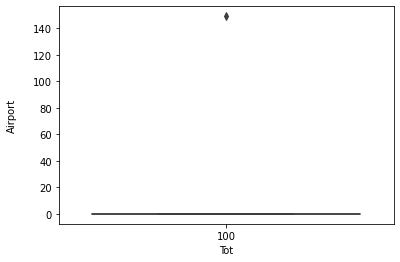

In [133]:
sns.boxplot(x = 'Tot', y = 'Airport\n', data = B)

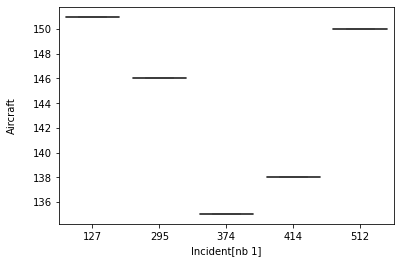

In [134]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = A)

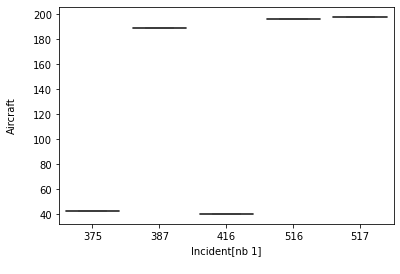

In [135]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = B)

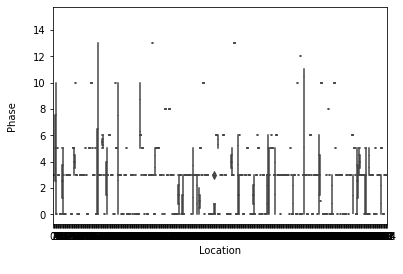

In [136]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = Data)

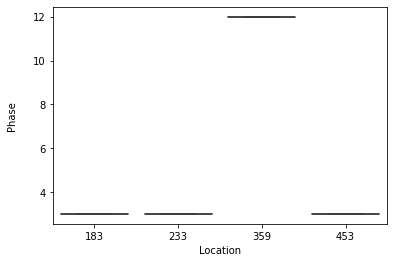

In [137]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = A)

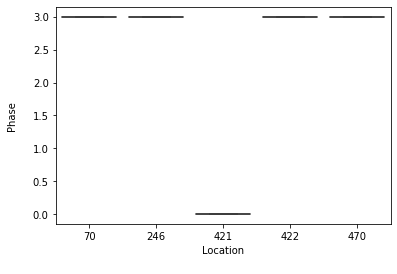

In [138]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = B)

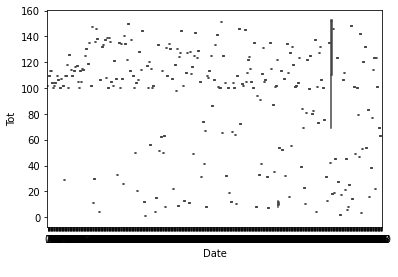

In [139]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = Data)

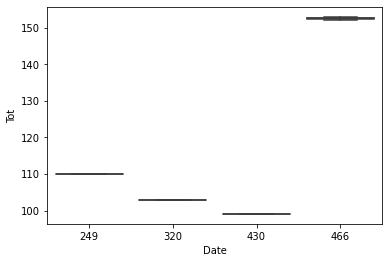

In [140]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = A)

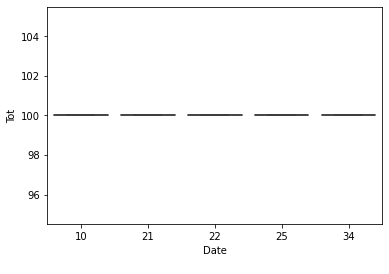

In [141]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = B)

## Box Plot in Plotly Express

In [142]:
px.box(A, x ='Date\n', y = 'Tot')

In [143]:
px.box(B, x ='Date\n', y = 'Tot')

In [144]:
px.box(Data, x ='Phase\n', y = 'P', color = 'C')

In [145]:
px.box(A, x ='Phase\n', y = 'P', color = 'C')

In [146]:
px.box(B, x ='Phase\n', y = 'P', color = 'C')

In [147]:
px.box(Data, x ='Phase\n', y = 'P', color = 'Aircraft\n')

In [148]:
px.box(A, x ='Phase\n', y = 'P', color = 'Aircraft\n')

In [149]:
px.box(B, x ='Phase\n', y = 'P', color = 'Aircraft\n')

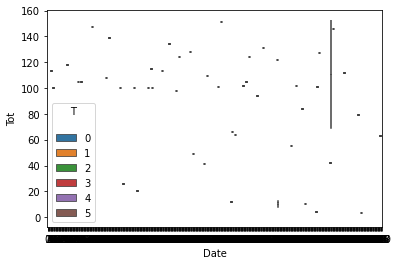

In [153]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = Data)

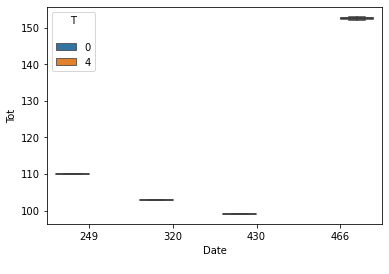

In [154]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = A)

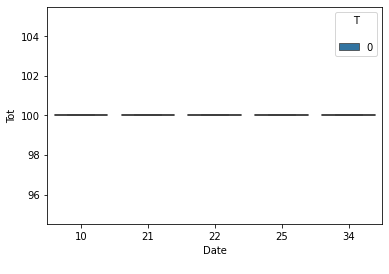

In [155]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = B)

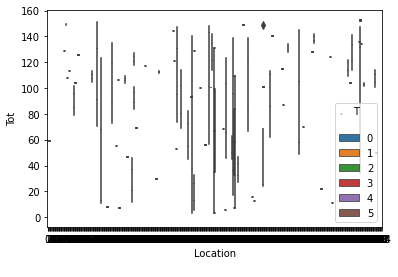

In [156]:
sns.boxplot(data = Data, x = 'Location\n', y = 'Tot', hue = 'T\n')

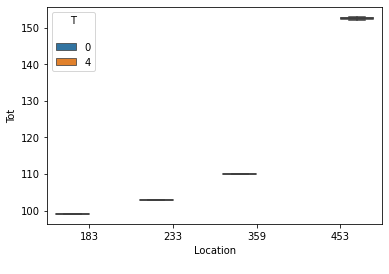

In [157]:
sns.boxplot(data = A, x = 'Location\n', y = 'Tot', hue = 'T\n')

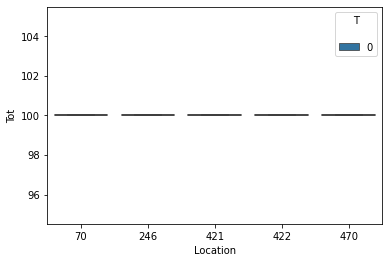

In [158]:
sns.boxplot(data = B, x = 'Location\n', y = 'Tot', hue = 'T\n')

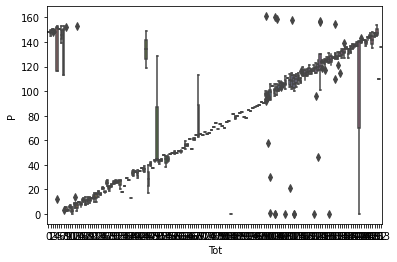

In [159]:
sns.boxplot(data = Data, x ='Tot', y = 'P')

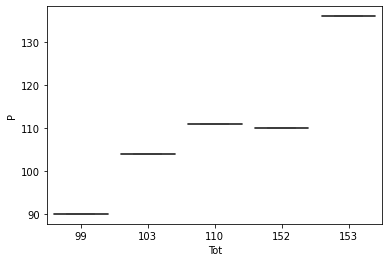

In [160]:
sns.boxplot(data = A, x ='Tot', y = 'P')

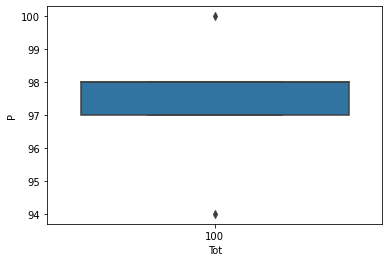

In [161]:
sns.boxplot(data = B, x ='Tot', y = 'P')

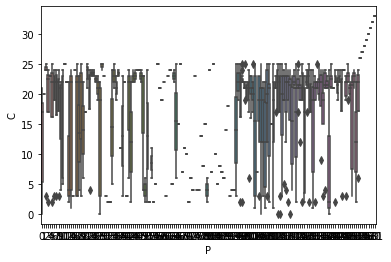

In [162]:
sns.boxplot(data = Data, x ='P', y = 'C')

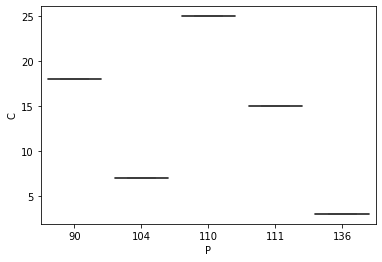

In [163]:
sns.boxplot(data = A, x ='P', y = 'C')

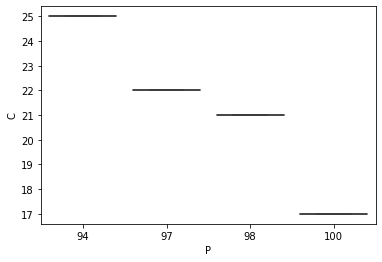

In [164]:
sns.boxplot(data = B, x ='P', y = 'C')

## OBSERVATION: 

Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).	

## Observation of Box Plot:

1. OUTLIERS: An outlier is an observation that is numerically distant from the rest of the data. Box plots are useful as they show outliers within a data set. When reviewing a box plot, an outlier is defined as a data point that is located outside the whiskers of the box plot.

2. Comparision of the medians, the interquartile ranges and whiskers of box plots.

3. Gives the potential outliers and signs of Skewness.

## JOINT PLOT: Seaborn's jointplot displays a relationship between 2 variables (bivariate) as well as 1D profiles (univariate) in the margins. This plot is a convenience class that wraps JointGrid.

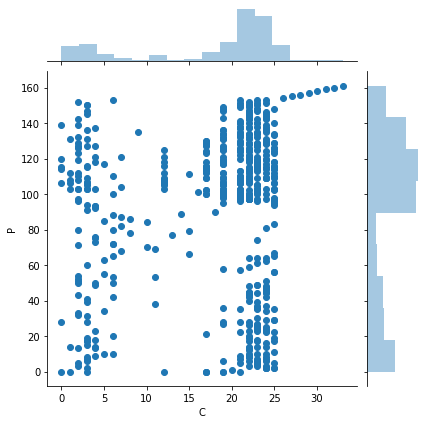

In [165]:
sns.jointplot(x = 'C', y = 'P', data = Data)

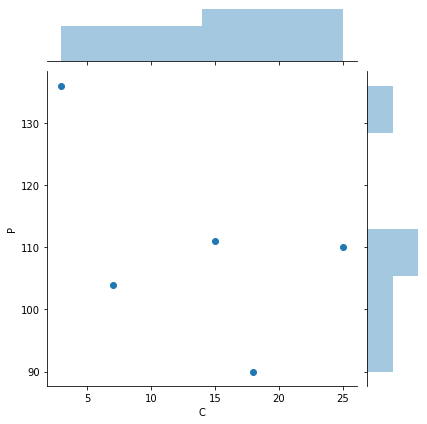

In [166]:
sns.jointplot(x = 'C', y = 'P', data = A)

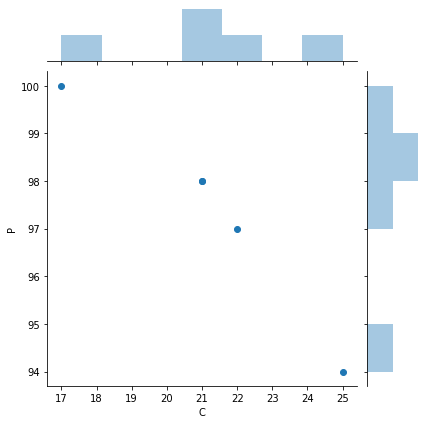

In [167]:
sns.jointplot(x = 'C', y = 'P', data = B)

## SCATTER PLOT: It's a diagram where each value in the DataFrame is represented by a dot. The Matplotlib module has a method for drawing scatter plots, it needs two arrays of the same length, one for the values of the x-axis, and one for the values of the y-axis

In [168]:
px.scatter(A, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

In [169]:
px.scatter(B, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

In [170]:
px.scatter(A, x = 'Phase\n', y = 'Airport\n')

In [171]:
px.scatter(B, x = 'Phase\n', y = 'Airport\n')

In [172]:
px.scatter(A, x = 'Date\n', y = 'Location\n')

In [173]:
px.scatter(B, x = 'Date\n', y = 'Location\n')

In [174]:
px.scatter(Data, x = 'C', y = 'P')

In [175]:
px.scatter(A, x = 'C', y = 'P')

In [176]:
px.scatter(B, x = 'C', y = 'P')

## Scatter Plot with OLS line

In [177]:
px.scatter(Data, x = 'C', y = 'P', trendline = 'ols')

In [178]:
px.scatter(A, x = 'C', y = 'P', trendline = 'ols')

In [179]:
px.scatter(B, x = 'C', y = 'P', trendline = 'ols')

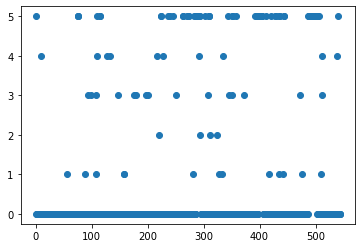

In [180]:
plt.scatter(Data['Incident[nb 1]\n'], Data['T\n'])
plt.show()

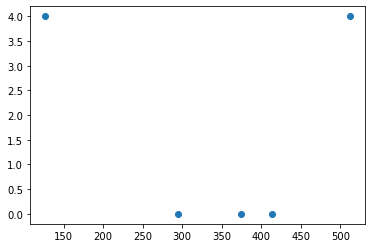

In [181]:
plt.scatter(A['Incident[nb 1]\n'], A['T\n'])
plt.show()

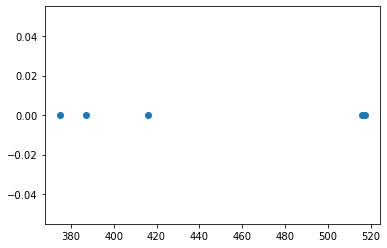

In [182]:
plt.scatter(B['Incident[nb 1]\n'], B['T\n'])
plt.show()

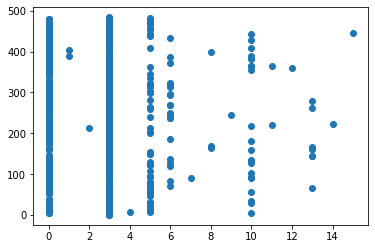

In [183]:
plt.scatter(Data['Phase\n'], Data['Location\n'])
plt.show()

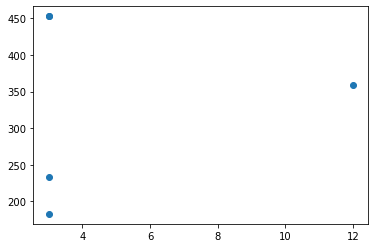

In [184]:
plt.scatter(A['Phase\n'], A['Location\n'])
plt.show()

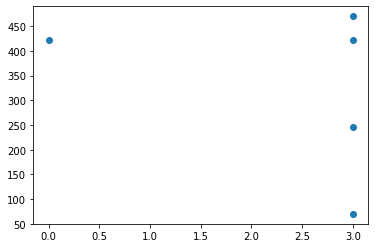

In [185]:
plt.scatter(B['Phase\n'], B['Location\n'])
plt.show()

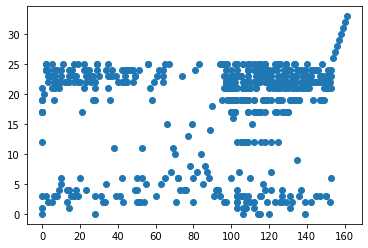

In [186]:
plt.scatter(Data['P'], Data['C'])
plt.show()

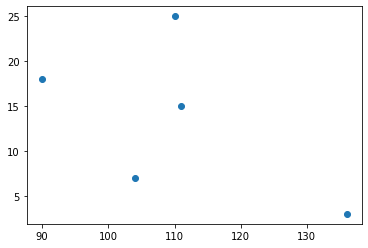

In [187]:
plt.scatter(A['P'], A['C'])
plt.show()

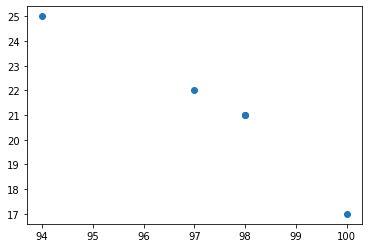

In [188]:
plt.scatter(B['P'], B['C'])
plt.show()

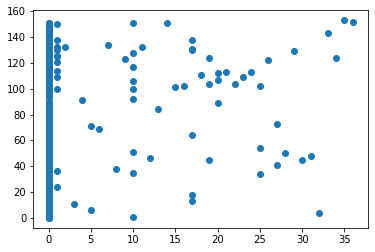

In [189]:
plt.scatter(Data['G'], Data['Tot'])
plt.show()

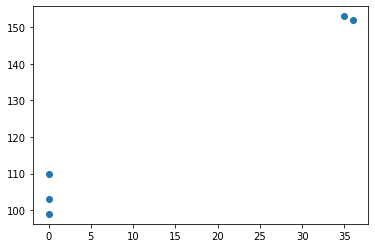

In [190]:
plt.scatter(A['G'], A['Tot'])
plt.show()

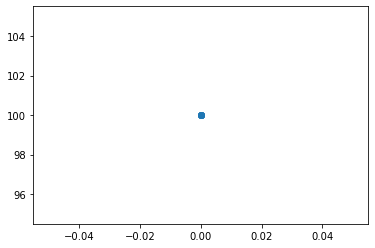

In [191]:
plt.scatter(B['G'], B['Tot'])
plt.show()

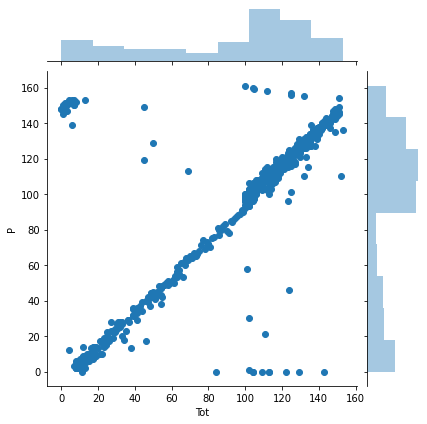

In [192]:
sns.jointplot(x = 'Tot', y ='P', data = Data, kind = 'scatter')

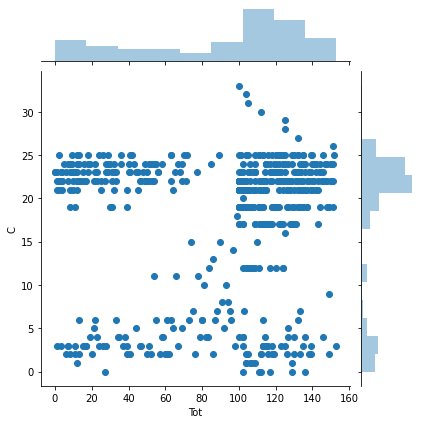

In [193]:
sns.jointplot(x = 'Tot', y ='C', data = Data, kind = 'scatter')

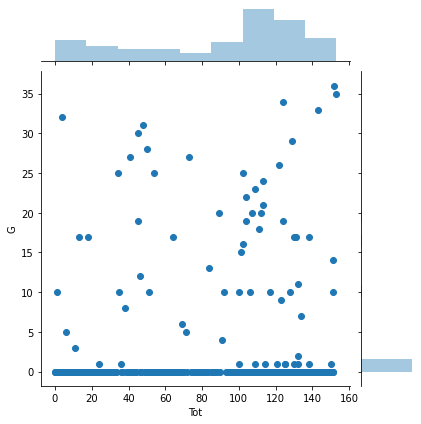

In [194]:
sns.jointplot(x = 'Tot', y ='G', data = Data, kind = 'scatter')

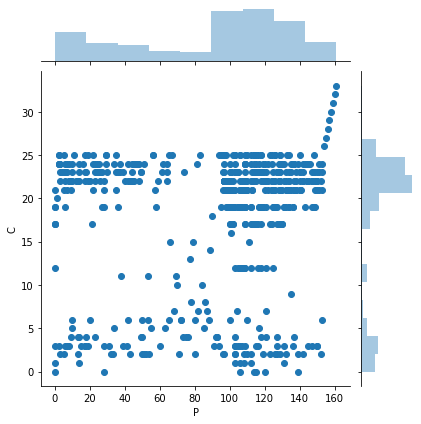

In [195]:
sns.jointplot(x = 'P', y ='C', data = Data, kind = 'scatter')

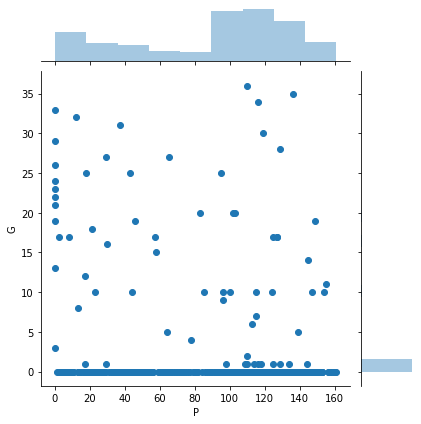

In [196]:
sns.jointplot(x = 'P', y ='G', data = Data, kind = 'scatter')

## OBSERVATION:

Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## Observation of Scatter Plot:

1. Pairs of numerical figures are present.

2. Dependent variables have multiple values for each figure associated with the independent variable.

3. Defining if there is a relationship between two variables and only show correlation.

4. Discrete data is best at pass/ fail measurements, Continuous data lets you measure things deeply on an infinite set and is generally used in scatter analysis.

## Observation of Joint Plot:

1. From the output, you can see that a joint plot has three parts.

2. A distribution plot at the top for the column on the x-axis, a distribution plot on the right for the column on the y-axis and a scatter plot in between that shows the mutual distribution of data for both the columns.

3. You can see that there is no correlation observed between the x, y variables as given in the input.

4. You can change the type of the joint plot by passing a value for the kind parameter.

## STRIP PLOT - BIVARIATE ANALYSIS: It's a graphical data anlysis technique for summarizing a univariate data set. The strip plot consists of: Horizontal axis = the value of the response variable is Categorical/Numerical. It is typically used for small DataFrame (histograms and density plots are typically preferred for larger data sets).

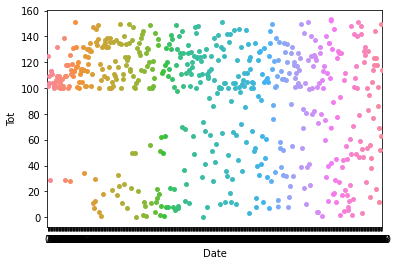

In [197]:
sns.stripplot(x = 'Date\n', y='Tot', data = Data)

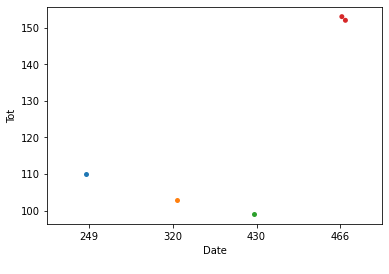

In [198]:
sns.stripplot(x = 'Date\n', y='Tot', data = A)

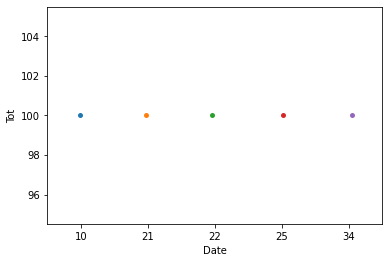

In [199]:
sns.stripplot(x = 'Date\n', y='Tot', data = B)

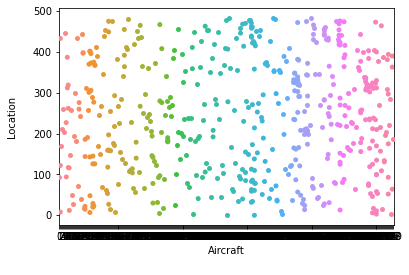

In [200]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = Data)

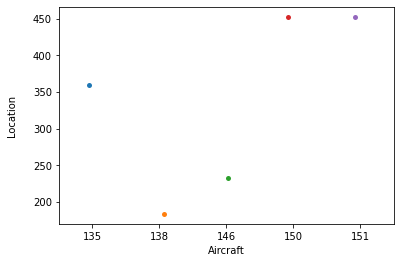

In [201]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = A)

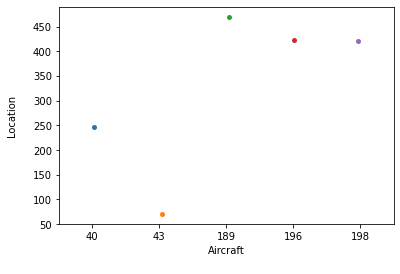

In [202]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = B)

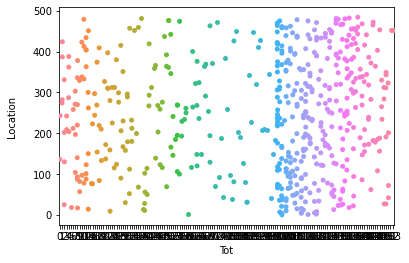

In [203]:
sns.stripplot(x = 'Tot', y='Location\n', data = Data)

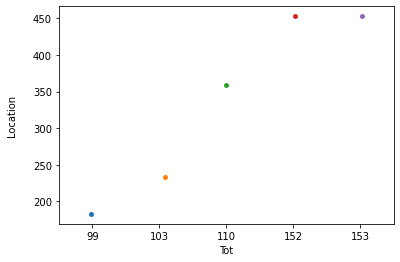

In [204]:
sns.stripplot(x = 'Tot', y='Location\n', data = A)

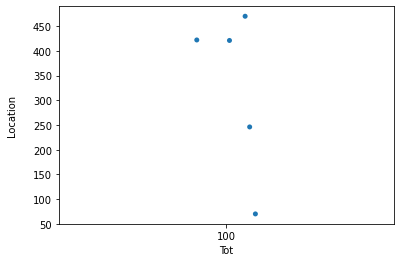

In [205]:
sns.stripplot(x = 'Tot', y='Location\n', data = B)

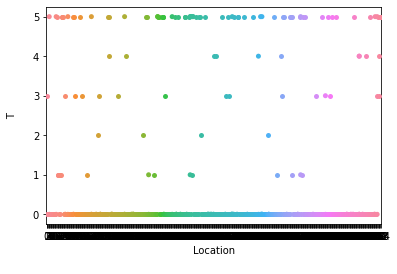

In [206]:
sns.stripplot(x = 'Location\n', y='T\n', data = Data)

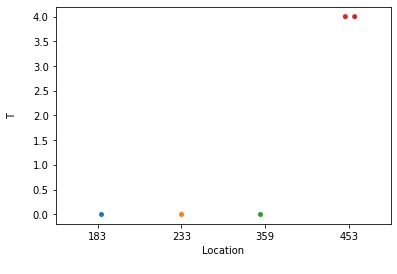

In [207]:
sns.stripplot(x = 'Location\n', y='T\n', data = A)

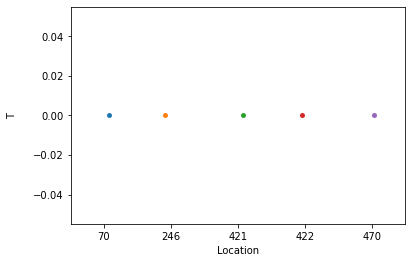

In [208]:
sns.stripplot(x = 'Location\n', y='T\n', data = B)

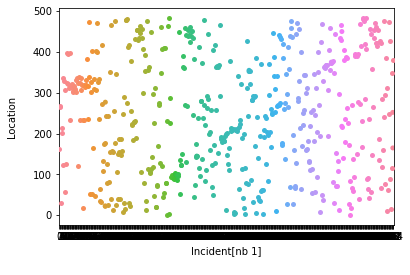

In [209]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = Data)

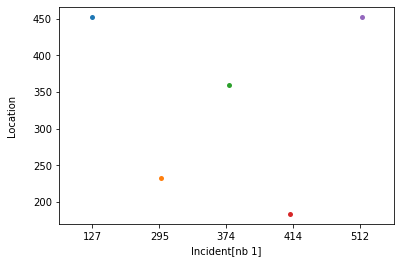

In [210]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = A)

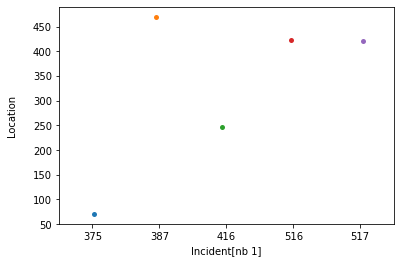

In [211]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = B)

In [212]:
px.strip(Data, x = 'Tot', y='Location\n')

In [213]:
px.strip(A, x = 'Tot', y='Location\n')

In [214]:
px.strip(B, x = 'Tot', y='Location\n')

In [215]:
px.strip(Data, x = 'Date\n', y='Phase\n')

In [216]:
px.strip(A, x = 'Date\n', y='Phase\n')

In [217]:
px.strip(B, x = 'Date\n', y='Phase\n')

In [218]:
px.strip(Data, x = 'Aircraft\n', y='Incident[nb 1]\n')

In [219]:
px.strip(A, x = 'Aircraft\n', y='Incident[nb 1]\n')

In [220]:
px.strip(B, x = 'Aircraft\n', y='Incident[nb 1]\n')

## Categorical Scatterplots - stripplot()

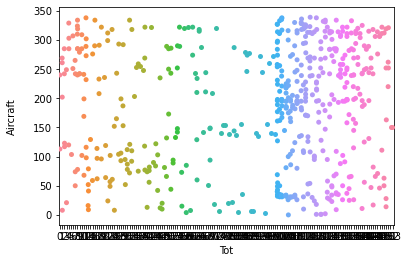

In [221]:
sns.stripplot(data = Data, x = 'Tot', y='Aircraft\n')

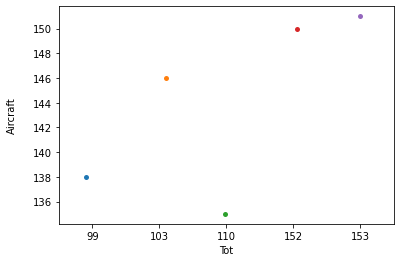

In [222]:
sns.stripplot(data = A, x = 'Tot', y='Aircraft\n')

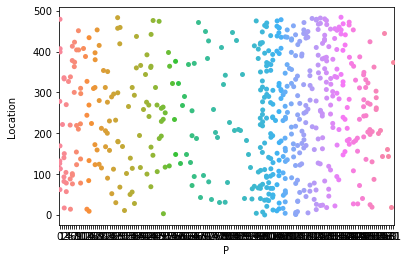

In [223]:
sns.stripplot(data = Data, x = 'P', y='Location\n')

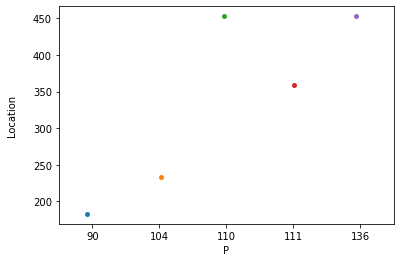

In [224]:
sns.stripplot(data = A, x = 'P', y='Location\n')

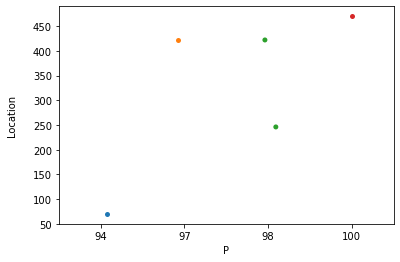

In [225]:
sns.stripplot(data = B, x = 'P', y='Location\n')

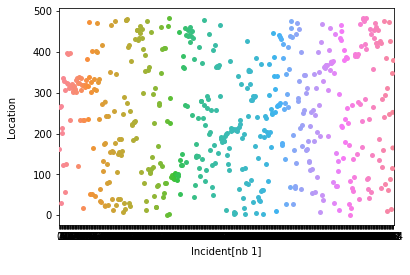

In [226]:
sns.stripplot(data = Data, x = 'Incident[nb 1]\n', y='Location\n')

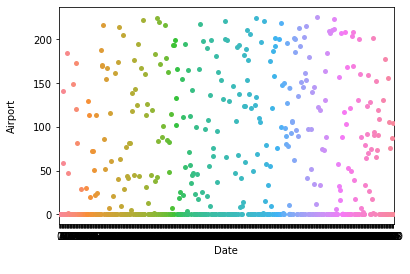

In [227]:
sns.stripplot(data = Data, x = 'Date\n', y='Airport\n')

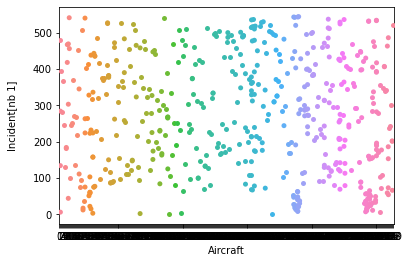

In [228]:
sns.stripplot(data = Data, x = 'Aircraft\n', y='Incident[nb 1]\n')

## OBSERVATION: 

Incident is high with United Airlines Flight 175, Aircraft:- Boeing 767-222: 56 Passengers(P), 9 Crew(C),  1,000 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## Observation of Strip Plot:

1. Some things to keep an eye out for when looking at data on a numeric variable: 
   (a) Skewness and Multimodality can be seen, but other visualizations show these more clearly. 
   (b) Gaps and Outliers can be revealed and data outside of the expected range. 
   (c) rounding, e.g. to integer values, or heaping, i.e. a few particular values occur very frequently. 
   (d) impossible or suspicious values.

2. Scalability in this form is limited due to over-plotting and can display up to 30,000 data points.

3. With a good combination of point size choice, jittering, and alpha blending the strip plot for groups of data can scale to several hundred thousand observations and ten to twenty of groups.

4. Storage needed for vector graphics images grows linearly with the number of observations.

## BAR GRAPH - BIVARIATE ANALYSIS: A bar chart or graph represents categorical data with rectangular bars with heights or lengths proportional to the values that they represent. The bars can be plotted vertically or horizontally. A vertical bar chart is sometimes called a column chart. The size of the bar represents its numeric value & also displays the values of several levels of grouping.

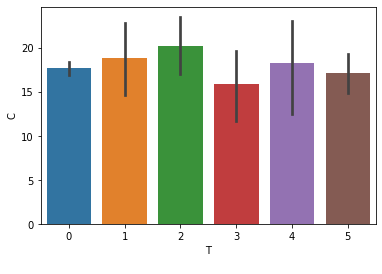

In [229]:
sns.barplot(x='T\n', y='C', data = Data)

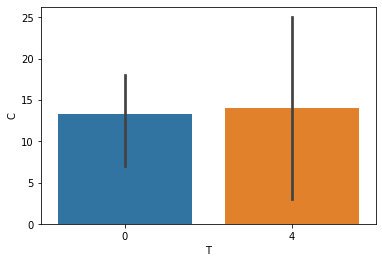

In [230]:
sns.barplot(x='T\n', y='C', data = A)

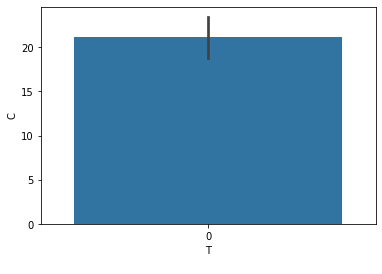

In [231]:
sns.barplot(x='T\n', y='C', data = B)

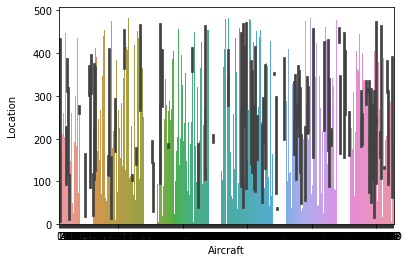

In [232]:
sns.barplot(x='Aircraft\n', y='Location\n', data = Data)

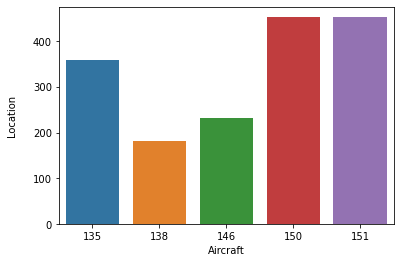

In [233]:
sns.barplot(x='Aircraft\n', y='Location\n', data = A)

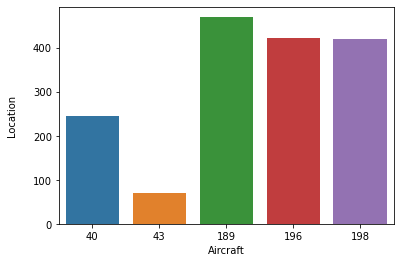

In [234]:
sns.barplot(x='Aircraft\n', y='Location\n', data = B)

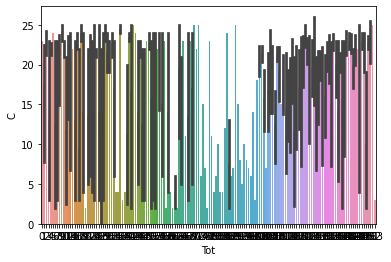

In [235]:
sns.barplot(x = 'Tot', y = 'C', data = Data)

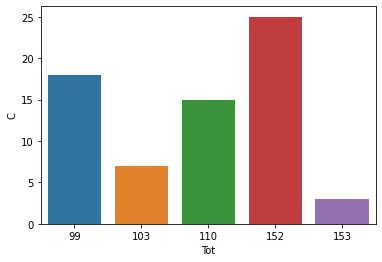

In [236]:
sns.barplot(x = 'Tot', y = 'C', data = A)

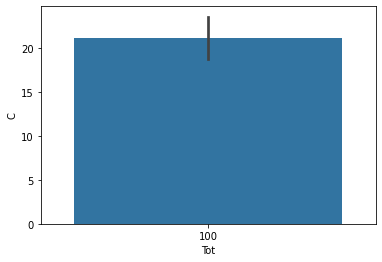

In [237]:
sns.barplot(x = 'Tot', y = 'C', data = B)

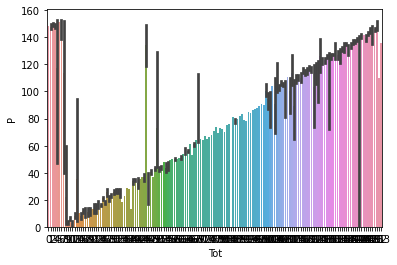

In [238]:
sns.barplot(x = 'Tot', y = 'P', data = Data)

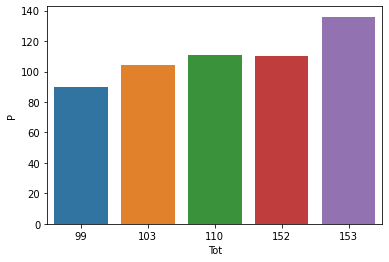

In [239]:
sns.barplot(x = 'Tot', y = 'P', data = A)

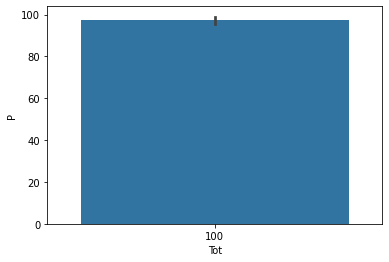

In [240]:
sns.barplot(x = 'Tot', y = 'P', data = B)

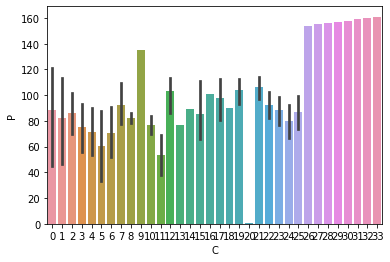

In [241]:
sns.barplot(x = 'C', y = 'P', data = Data)

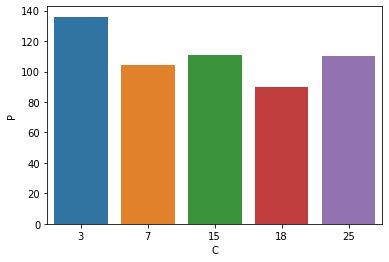

In [242]:
sns.barplot(x = 'C', y = 'P', data = A)

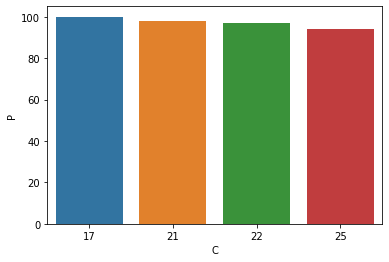

In [243]:
sns.barplot(x = 'C', y = 'P', data = B)

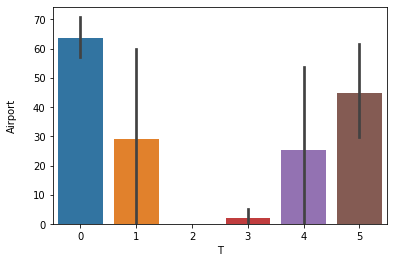

In [244]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = Data)

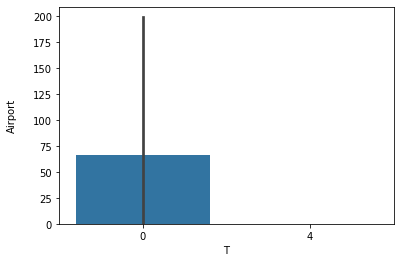

In [245]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = A)

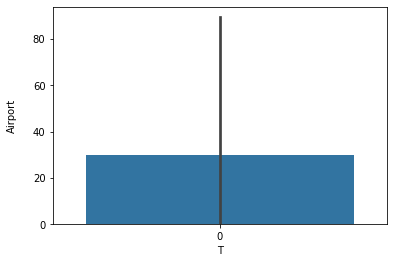

In [246]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = B)

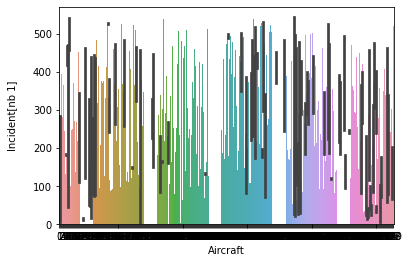

In [247]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = Data)

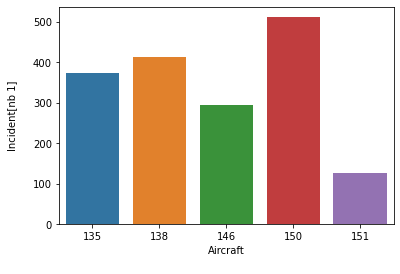

In [248]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = A)

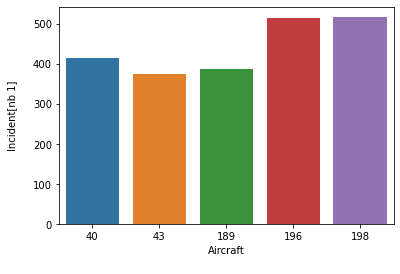

In [249]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = B)

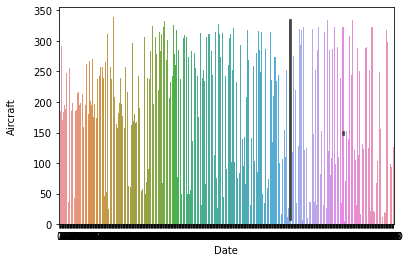

In [250]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = Data)

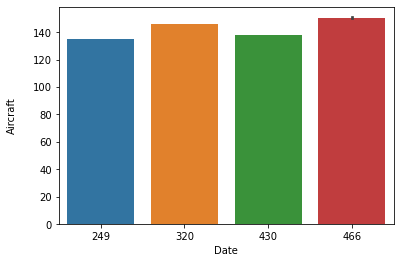

In [251]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = A)

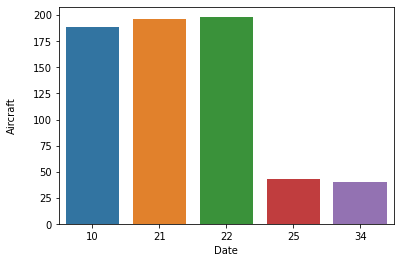

In [252]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = B)

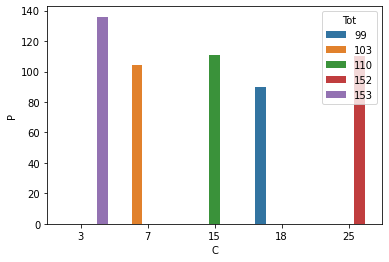

In [254]:
sns.barplot(x = 'C', y = 'P', hue ='Tot', data = A)

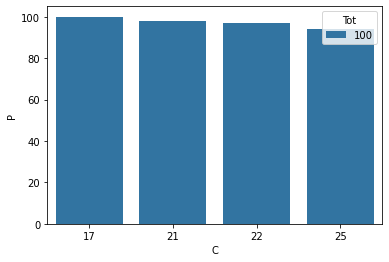

In [255]:
sns.barplot(x = 'C', y = 'P', hue ='Tot', data = B)

## OBSERVATIONS: 

1. Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

2. Incident is high with United Airlines Flight 175, Aircraft:- Boeing 767-222: 56 Passengers(P), 9 Crew(C),  1,000 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## Observation of Bar Plot:

1. They are created to show data in multiple, highly visual waysTo interpret the length of the bars/columns determines the value as described on the y-axis.

2. Bar graphs have an x- and y-axis and can be used to showcase one, two, or many categories of data where Single and dual bar charts are practised using them to represent data to show the total size of groups.

3. Shows how the proportions between groups related to each other, in addition to the total of each group.

4. The columns can contain multiple labeled variables (or just one), or they can be grouped together (or not) for comparative purposes.

## PIE CHART: A pie chart (or a circle chart) is a circular statistical plot,  that can display only one series of data which is divided into slices to illustrate numerical proportion. The area of the chart is the total percentage of the given data. The arc length of each slice (and consequently its central angle and area), is proportional to the quantity it represents. While it is named for its resemblance to a pie which has been sliced, there are variations on the way it can be presented. The slices of pie are called wedges. 

In [256]:
px.pie(Data, names = 'Aircraft\n', values = 'Location\n')

In [257]:
px.pie(A, names = 'Aircraft\n', values = 'Location\n')

In [258]:
px.pie(Data, names = 'Location\n', values = 'Airport\n')

In [259]:
px.pie(A, names = 'Location\n', values = 'Airport\n')

In [260]:
px.pie(Data, names = 'T\n', values = 'Date\n')

In [261]:
px.pie(A, names = 'T\n', values = 'Date\n')

In [262]:
px.pie(Data, names = 'Phase\n', values = 'Date\n')

In [263]:
px.pie(A, names = 'Phase\n', values = 'Date\n')

In [264]:
px.pie(Data, names = 'P', values = 'Incident[nb 1]\n')

In [265]:
px.pie(A, names = 'P', values = 'Incident[nb 1]\n')

In [266]:
px.pie(Data, names = 'T\n', values = 'Phase\n')

In [267]:
px.pie(A, names = 'T\n', values = 'Phase\n')

In [268]:
px.pie(Data, names = 'Tot', values = 'Date\n')

In [269]:
px.pie(A, names = 'Tot', values = 'Date\n')

In [270]:
px.pie(Data, names = 'T\n', values = 'Aircraft\n')

In [271]:
px.pie(A, names = 'T\n', values = 'Aircraft\n')

In [272]:
px.pie(B, names = 'T\n', values = 'Aircraft\n')

In [273]:
px.pie(Data, names = 'T\n', values = 'Airport\n')

In [274]:
px.pie(A, names = 'T\n', values = 'Airport\n')

In [275]:
px.pie(B, names = 'T\n', values = 'Airport\n')

## OBSERVATIONS: 

1. Incident is high with Airblue Flight 202, Aircraft:- Airbus A321-231: 146 Passengers(P), 6 Crew(C), were dead by Commercial (T: accident/incident) on Approach(Phase) on 28-7-2010(Date) from a distance of 15km (9.3 mi) at Islamabad, Pakistan APR(Location).

2. Incident is high with Yemenia Flight 626, Aircraft:- Airbus A310-324: 141 Passengers(P), 11 Crew(C), were dead by Commercial (T: accident/incident) on Approach(Phase) on 30-6-2009(Date) from a distance of 40km (25 min) at Mozambique Channel off Mitsamiouli, Comoros(Location).

## Observation of Pie Chart:

1. When you interpret one pie chart, we get the differences in the size of the slices as per the data taken.

2. The size of a slice shows the proportion of observations that are in that group.

3. When you compare multiple pie charts, we get the differences in the size of slices for the same categories in all the pie charts.

## HEXBIN PLOT: It represent the relationship of 2 numerical variables when you have a lot of data points. Instead of overlapping, the plotting window is split in several hexbins, and the number of points per hexbin is counted. The color denotes this number of points.

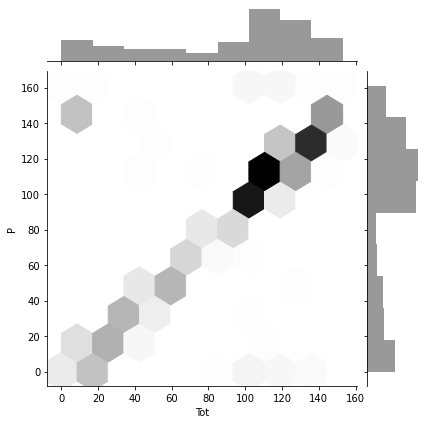

In [276]:
sns.jointplot(x = 'Tot', y = 'P', data = Data, kind='hex', color='k')

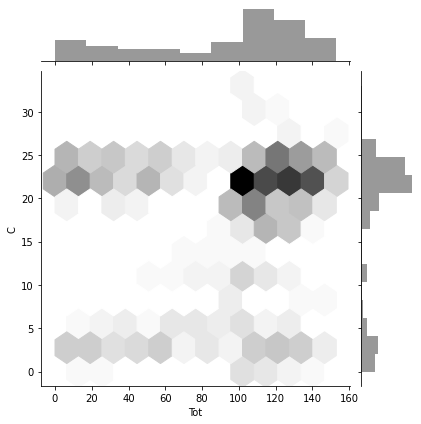

In [277]:
sns.jointplot(x = 'Tot', y = 'C', data = Data, kind='hex', color='k')

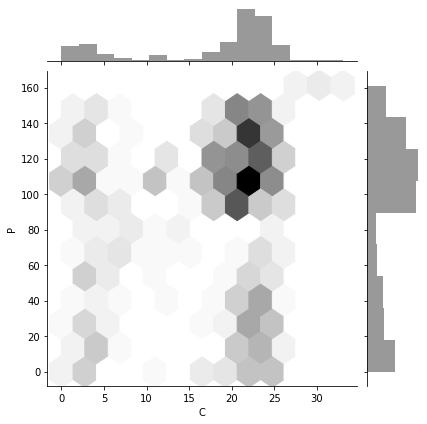

In [278]:
sns.jointplot(x = 'C', y = 'P', data = Data, kind='hex', color='k')

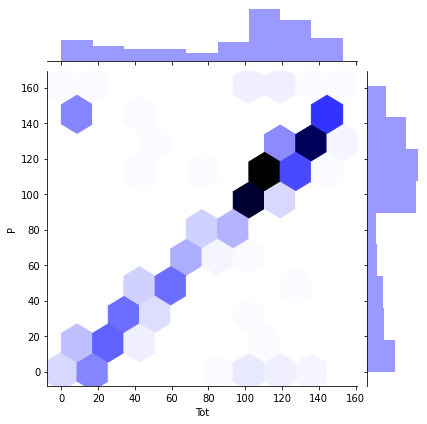

In [279]:
sns.jointplot(x = 'Tot', y = 'P', data = Data, kind='hex', color='b')

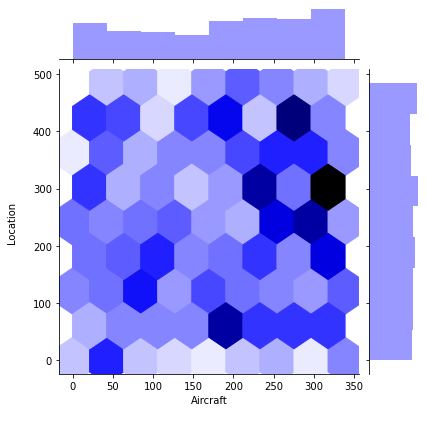

In [280]:
sns.jointplot(x = 'Aircraft\n', y = 'Location\n', data = Data, kind='hex', color='b')

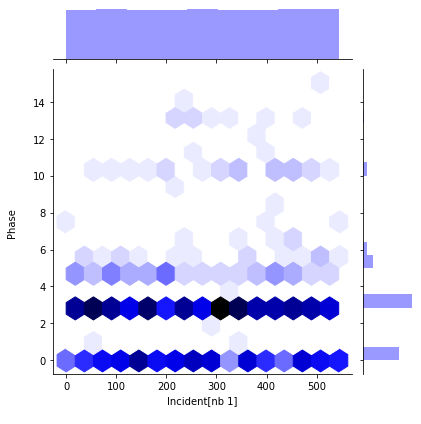

In [281]:
sns.jointplot(x = 'Incident[nb 1]\n', y = 'Phase\n', data = Data, kind='hex', color='b')

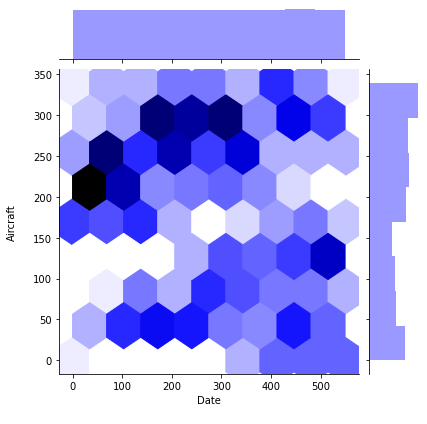

In [282]:
sns.jointplot(x = 'Date\n', y = 'Aircraft\n', data = Data, kind='hex', color='b')

## OBSERVATION: 

Incident is high with Sosoliso Airlines Flight 1145, Aircraft:- McDonnell Douglas DC-9-32: 101 Passengers(P), 7 Crew(C), were dead by Commercial (T: accident/incident) on PHC(Phase) on 10-12-2005(Date) at Port Harcourt, Nigeria, LDG (Location).

## Observation of Hexbin Plot:

1. Instead of overlapping, the plotting window is split in several hexbins, and the number of points per hexbin is counted.

2. The color denotes this number of points.

3. The size of the hexagons changes - the scale of the color bar guide is redefined accordingly and We can change the size of the bins using the gridsize argument.

4. We get a clear picture of density, distributions, and relative ranges, similar to a heat map.

5. The shape of the hexagon allows us to limit the effects of edge biases found in square bins, while retaining the ability to form a continuous grid.

## SWARM PLOT: This style of plot is sometimes called a “beeswarm”. A swarm plot can be drawn on its own, but it is also a good complement to a box or violin plot in cases where you want to show all observations along with some representation of the underlying distribution. A categorical scatterplot where the points do not overlap. Can be used with other plots to show each observation and it's very similar to a strip plot, yet the locations of points are adjusted automatically to avoid overlap even if the jitter value is not applied.

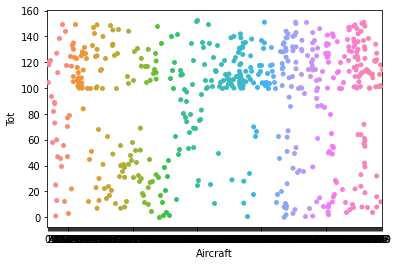

In [283]:
sns.swarmplot(data = Data, x = 'Aircraft\n', y = 'Tot')

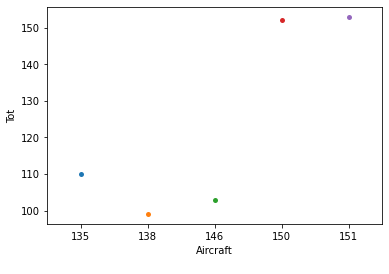

In [284]:
sns.swarmplot(data = A, x = 'Aircraft\n', y = 'Tot')

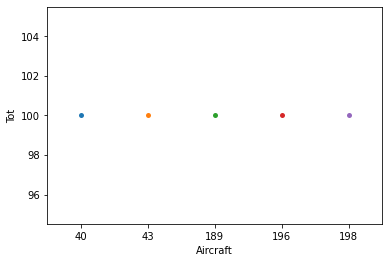

In [285]:
sns.swarmplot(data = B, x = 'Aircraft\n', y = 'Tot')

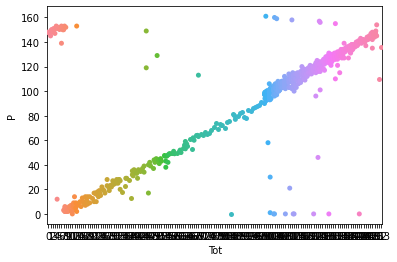

In [286]:
sns.swarmplot(data = Data, x = 'Tot', y = 'P')

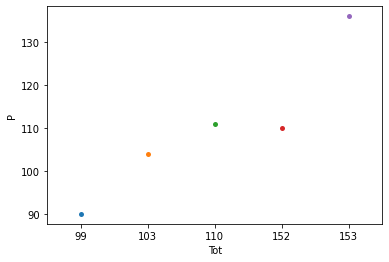

In [287]:
sns.swarmplot(data = A, x = 'Tot', y = 'P')

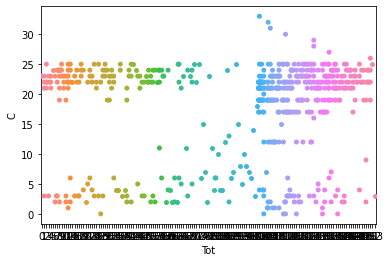

In [288]:
sns.swarmplot(data = Data, x = 'Tot', y = 'C')

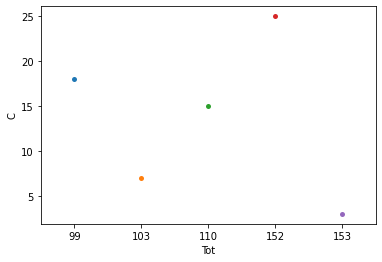

In [289]:
sns.swarmplot(data = A, x = 'Tot', y = 'C')

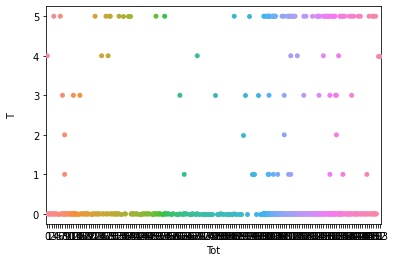

In [290]:
sns.swarmplot(data = Data, x = 'Tot', y = 'T\n')

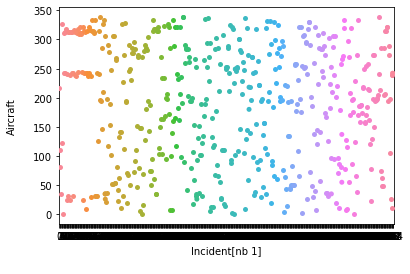

In [291]:
sns.swarmplot(data = Data, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

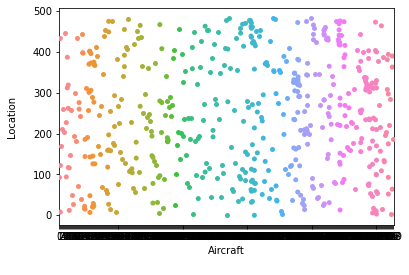

In [292]:
sns.swarmplot(data = Data, x = 'Aircraft\n', y = 'Location\n')

## OBSERVATION: 

Incident is high with Cebu Pacific Air Flight 387, Aircraft:- McDonnell Douglas DC-9-32: 99 Passengers(P), 5 Crew(C), were dead by Commercial (T: accident/incident) on En Route(Phase) on 02-2-1998(Date) at Mount Balatukan, Philippines(Location).

## Observation of Swarm Plot:

1. It can give a better representation of the distribution of observations, although it only works well for relatively small datasets.

2. Enlarging the plot and Separate points by hue using the argument split = True.

3. Place the legend to the right while Adjusting the y-axis limits to end at 0.

## COUNT PLOT: It can be thought of as a histogram across a categorical, instead of quantitative, variable. The basic API and options are identical to those for barplot() , so we can compare counts across nested variables.

## palette function: It denote colors as per the given input standards.

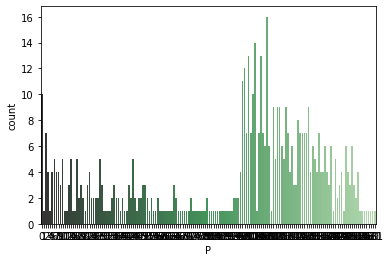

In [294]:
sns.countplot(x = 'P', data = Data, palette ='Greens_d')

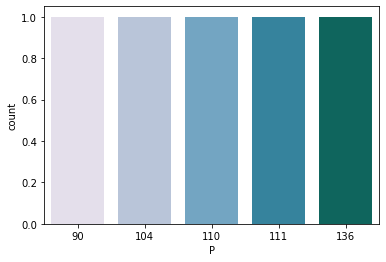

In [295]:
sns.countplot(x = 'P', data = A, palette ='PuBuGn')

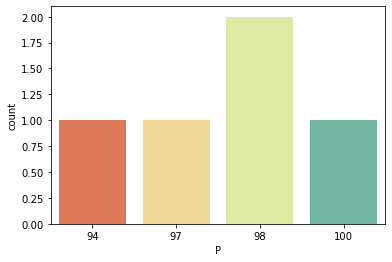

In [296]:
sns.countplot(x = 'P', data = B, palette ='Spectral')

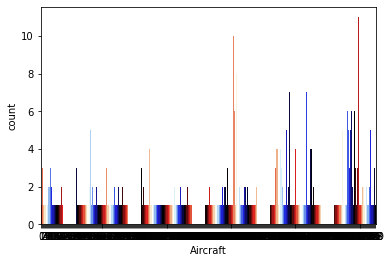

In [297]:
sns.countplot(x = 'Aircraft\n', data = Data, palette ='flag')

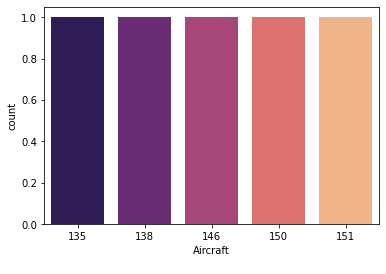

In [298]:
sns.countplot(x = 'Aircraft\n', data = A, palette ='magma')

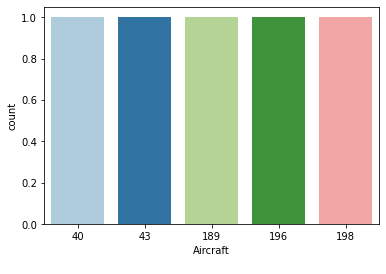

In [299]:
sns.countplot(x = 'Aircraft\n', data = B, palette ='Paired')

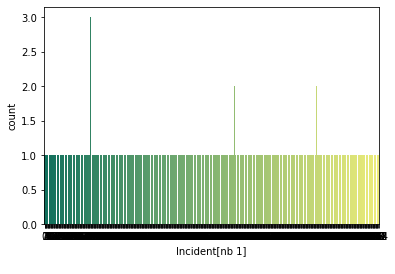

In [300]:
sns.countplot(x = 'Incident[nb 1]\n', data = Data, palette ='summer')

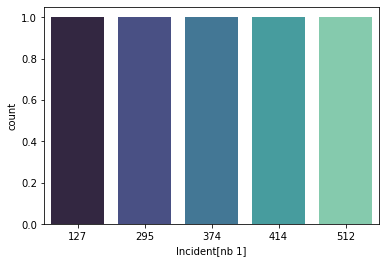

In [301]:
sns.countplot(x = 'Incident[nb 1]\n', data = A, palette ='mako')

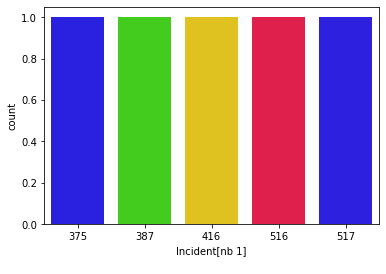

In [302]:
sns.countplot(x = 'Incident[nb 1]\n', data = B, palette ='prism')

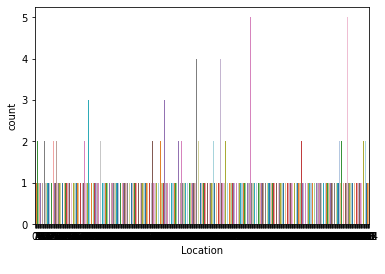

In [303]:
sns.countplot(x = 'Location\n', data = Data, palette='tab20')

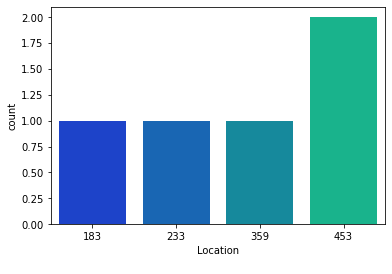

In [304]:
sns.countplot(x = 'Location\n', data = A, palette='winter')

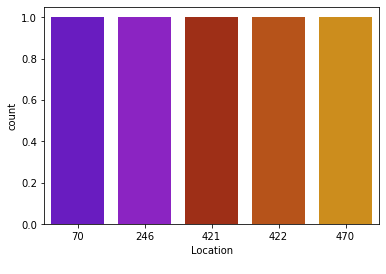

In [305]:
sns.countplot(x = 'Location\n', data = B, palette='gnuplot')

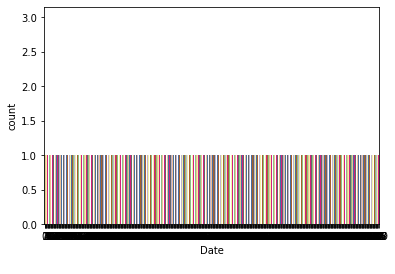

In [306]:
sns.countplot(x = 'Date\n', data = Data, palette='Accent')

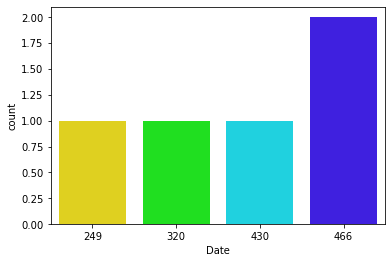

In [307]:
sns.countplot(x = 'Date\n', data = A, palette='gist_rainbow')

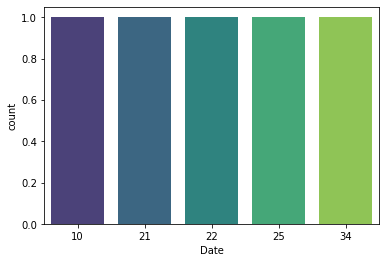

In [308]:
sns.countplot(x = 'Date\n', data = B, palette='viridis')

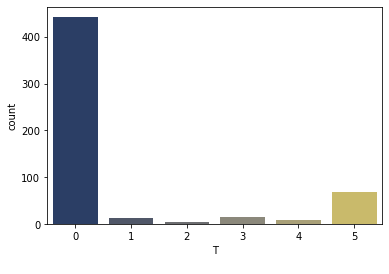

In [309]:
sns.countplot(x = 'T\n', data = Data, palette='cividis')

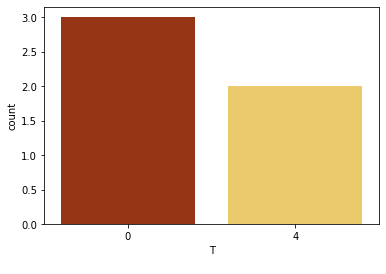

In [310]:
sns.countplot(x = 'T\n', data = A, palette='afmhot')

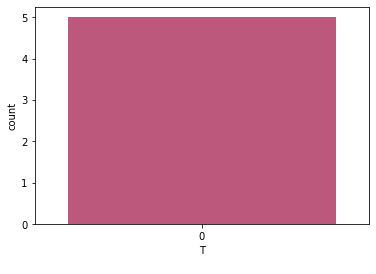

In [311]:
sns.countplot(x = 'T\n', data = B, palette='plasma')

## OBSERVATION: 

Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## Observation of Count Plot:

1. Vectors of data represented as lists, numpy arrays, or pandas Series objects passed directly to the x, y, and/or hue parameters.

2. In most cases, it is possible to use numpy or Python objects, but pandas objects are preferable because the associated names will be used to annotate the axes. Additionally, we can use Categorical types for the grouping variables to control the order of plot elements.

3. A "long-form" DataFrame, in which case the x, y, and hue variables will determine how the data are plotted.

4. A “wide-form” DataFrame, such that each numeric column will be plotted.

## HEATMAP: A heatmap (aka heat map) depicts values for a main variable of interest across two axis variables as a grid of colored squares. The axis variables are divided into ranges like a bar chart or histogram, and each cell's color indicates the value of the main variable in the corresponding cell range.

## CORRELATION OF A HEATMAP: A correlation heatmap uses colored cells, typically in a monochromatic scale, to show a 2D correlation matrix (table) between two discrete dimensions or event types. The values of the first dimensions appear as rows of the table, while the values of the second dimension are represented by the columns of the table.

## CORRELATION BETWEEN DIFFERENT VARIABLES

Index(['Tot', 'C', 'P', 'G', 'N', 'T\n', 'Incident[nb 1]\n', 'Aircraft\n',
       'Location\n', 'Phase\n', 'Airport\n', 'Distance\n', 'Date\n'],
      dtype='object')

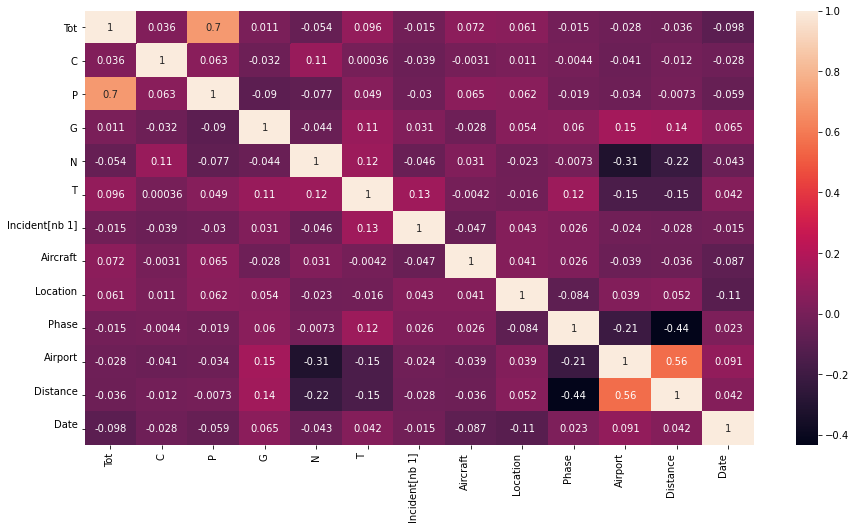

In [312]:
corr = Data.corr(method = 'kendall')
plt.figure(figsize = (15, 8))
sns.heatmap(corr, annot = True)
Data.columns

## Observation of Heat Map:

1. Feature-expression heat maps provide insight into complex associations.

2. It utilizes effect ordered data display on two variable sets.

3. Its applications are found in complex biological systems.

4. Effect size (color) and statistical significance (radius) are depicted in circles.

## POINT PLOT: In seaborn, Point plot means a scatter plot depicting point estimations for categories with defined confidence intervals.The point plot also draws error lines (also called as bars or glyphs) that are extended from the points to desrcibe the dispersion or uncertainty of the point estimate. It represents an estimate of central tendency for a numeric variable by the position of scatter plot points and provides some indication of the uncertainty around that estimate using error bars.

## CATPLOT: It's a relatively new addition to Seaborn that simplifies plotting that involves categorical variables. Catplot function can do all these types of plots and one can specify the type of plot one needs with the kind parameter. The default kind in catplot() is “strip”, corresponding to stripplot(). Combines a categorical plot with a FacetGrid.

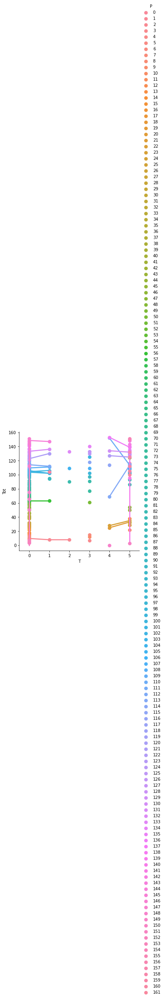

In [313]:
sns.catplot(x = "T\n", y = "Tot", hue = "P", kind = "point", data = Data)

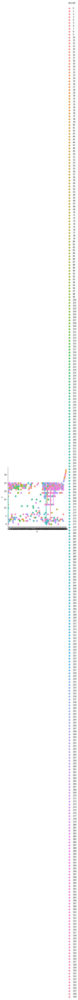

In [314]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = Data)

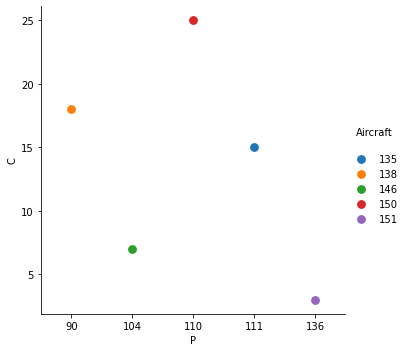

In [315]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = A)

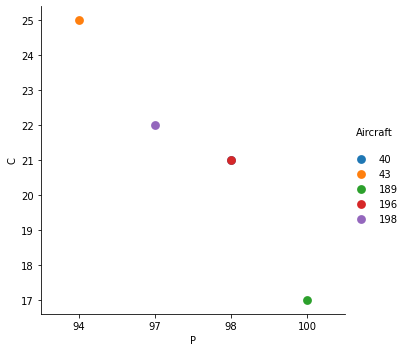

In [316]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = B)

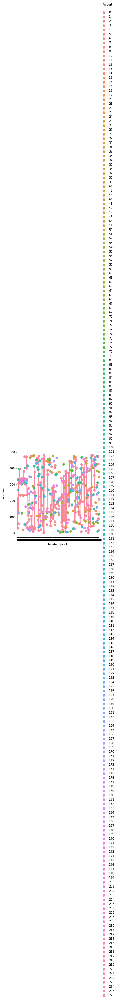

In [317]:
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = Data)

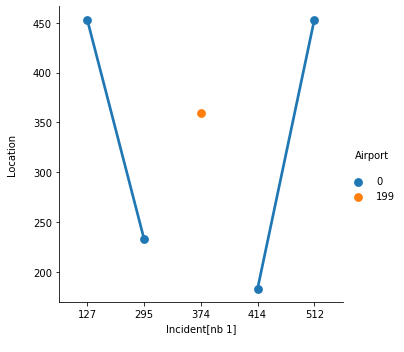

In [318]:
A = Data.head()
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = A)

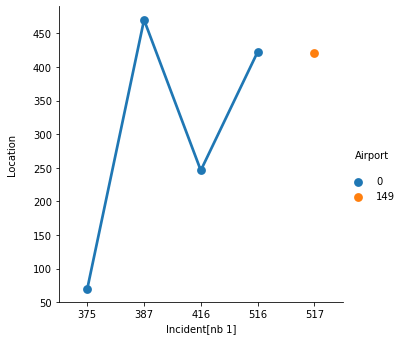

In [319]:
B = Data.tail()
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = B)

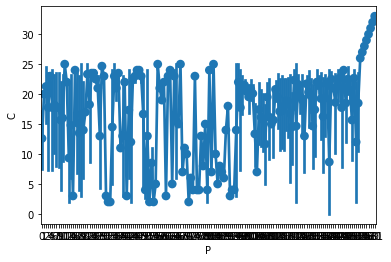

In [320]:
ax = sns.pointplot(x = "P", y = "C", data = Data)

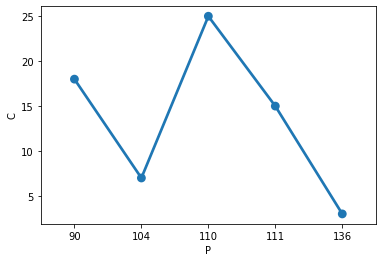

In [321]:
ax = sns.pointplot(x = "P", y="C", data = A)

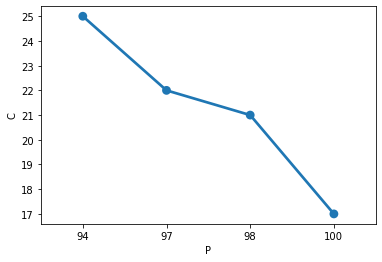

In [322]:
ax = sns.pointplot(x = "P", y="C", data = B)

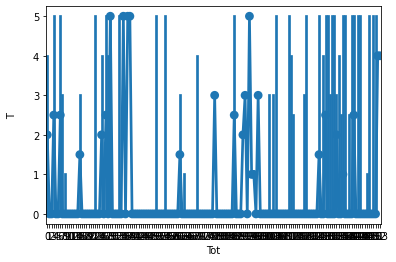

In [323]:
ax = sns.pointplot(x = "Tot", y = "T\n", data = Data, estimator = median)

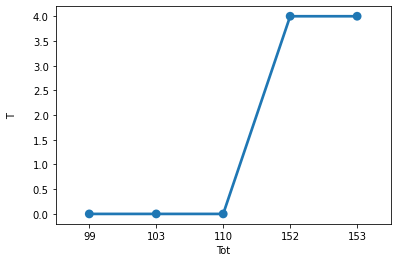

In [324]:
ax = sns.pointplot(x = "Tot", y = "T\n", data = A, estimator = median)

## OBSERVATION: 

Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## Observation of Point Plot:

1. Point plots can be more useful than bar plots for focusing comparisons between different levels of one or more categorical variables.

2. They are particularly adept at showing interactions: how the relationship between levels of one categorical variable changes across levels of a second categorical variable. The lines that join each point from the same hue level allow interactions to be judged by differences in slope, which is easier for the eyes than comparing the heights of several groups of points or bars.

3. It is important to keep in mind that a point plot shows only the mean (or other estimator) value, but in many cases it may be more informative to show the distribution of values at each level of the categorical variables. In that case, other approaches such as a box or violin plot may be more appropriate.

## VIOLIN PLOT: A combination of boxplot and kernel density estimation, plays a similar role as a box and whisker plot. It shows the distribution of quantitative data across several levels of one (or more) categorical variables such that those distributions can be compared.

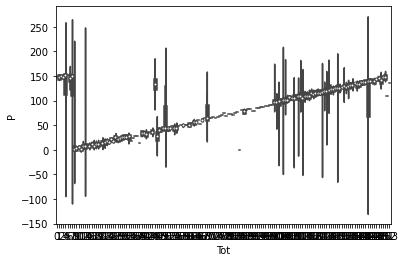

In [325]:
sns.violinplot(x = Data.Tot, y = Data.P)

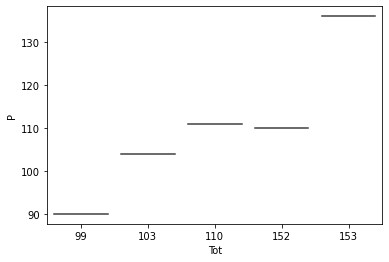

In [326]:
sns.violinplot(x = A.Tot, y = A.P)

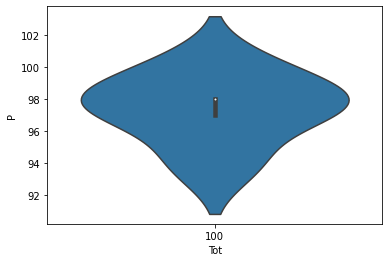

In [327]:
sns.violinplot(x = B.Tot, y = B.P)

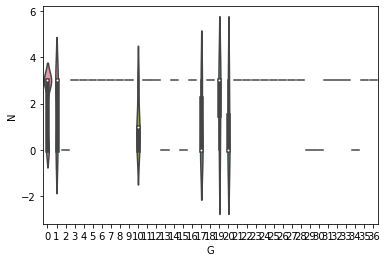

In [328]:
sns.violinplot(x = Data.G, y = Data.N)

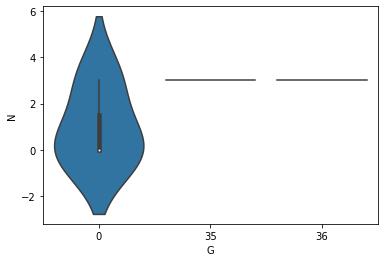

In [329]:
sns.violinplot(x = A.G, y = A.N)

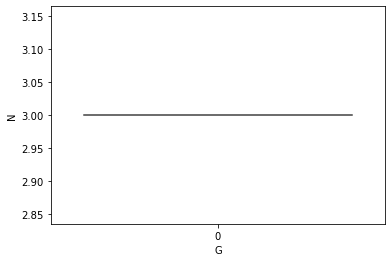

In [330]:
sns.violinplot(x = B.G, y = B.N)

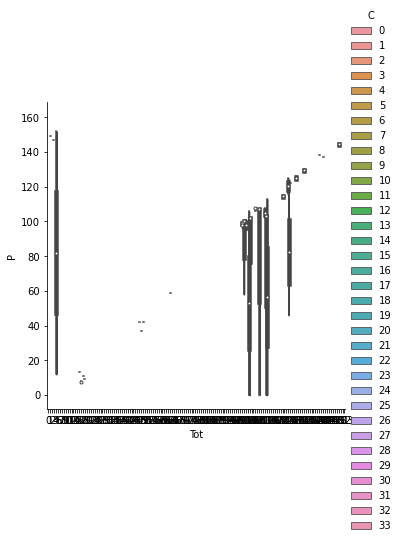

In [331]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=Data)

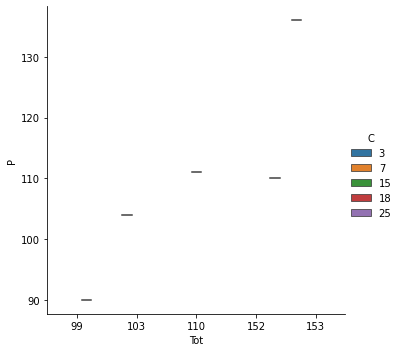

In [332]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=A)

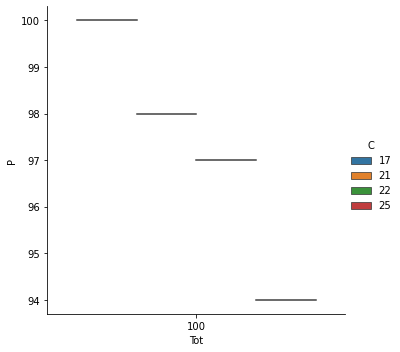

In [333]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=B)

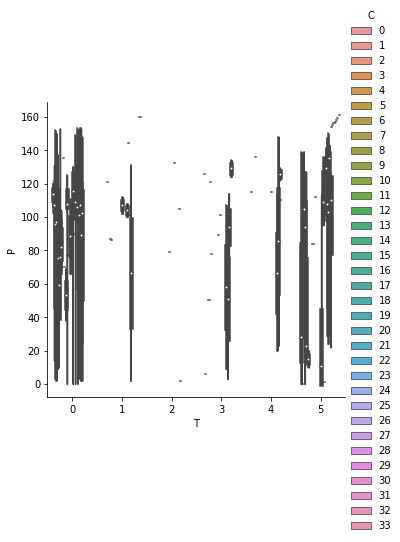

In [334]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=Data)

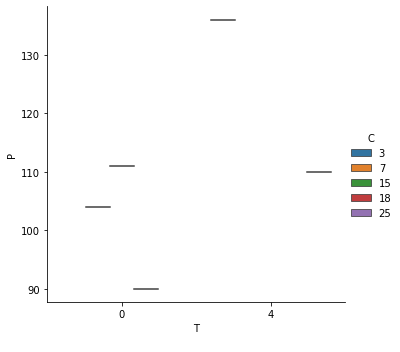

In [335]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=A)

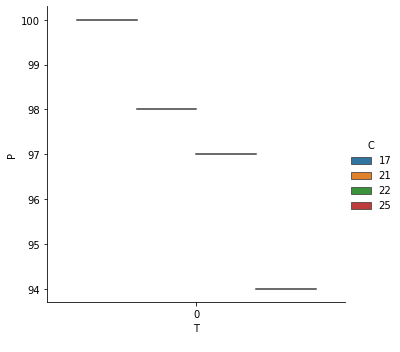

In [336]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=B)

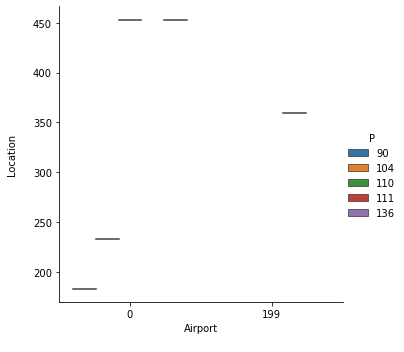

In [337]:
sns.catplot(x = "Airport\n", y = "Location\n", hue = "P", kind = "violin", bw = .15, cut = 0, data = A)

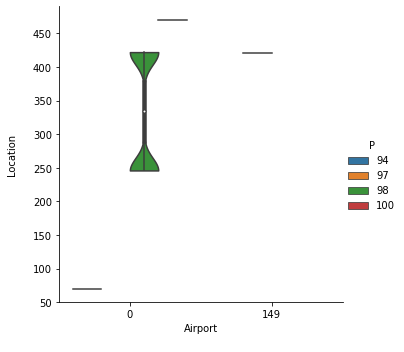

In [338]:
sns.catplot(x = "Airport\n", y = "Location\n", hue = "P", kind = "violin", bw = .15, cut = 0, data = B)

## OBSERVATION:

Incident is high with Airblue Flight 202, Aircraft:- Airbus A321-231: 146 Passengers(P), 6 Crew(C), were dead by Commercial (T: COM - accident/incident) on Approach(Phase) from 15km (9.3 mi) on 28-7-2010(Date) at Islamabad, Pakistan (Location).

## Observation of Violin Plot:

1. The white dot represents the median, the thick gray bar in the center represents the interquartile range, the thin gray line represents the rest of the distribution, except for points that are determined to be “outliers” using a method that is a function of the interquartile range.

2. Violin plot are made vertically most of the time, If you have long labels building an horizontal version{Output[22]} like above make the labels more readable.

3. If the variable are grouped, we can build a grouped violin as you would do for a boxplot.

## BOXEN PLOT: It is similar to a box plot in plotting a nonparametric representation of a distribution in which all features correspond to actual observations. By plotting more quantiles, it provides more information about the shape of the distribution, particularly in the tails. Syntax : seaborn.boxenplot(parameters)

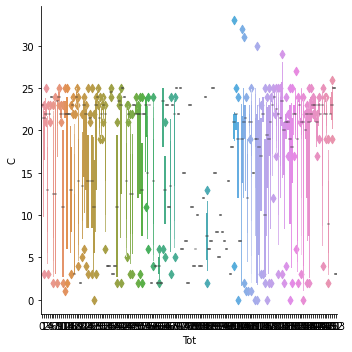

In [339]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = Data.sort_values("P"))

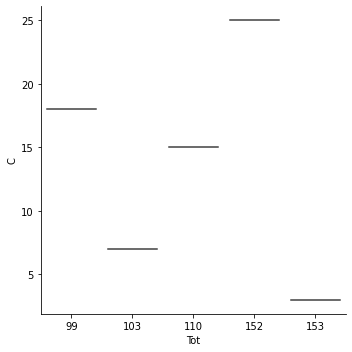

In [340]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = A.sort_values("P"))

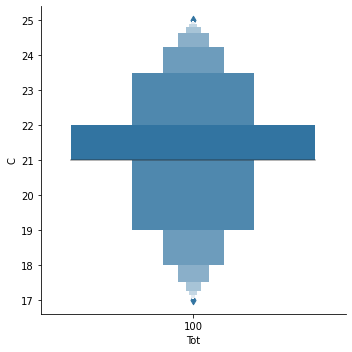

In [341]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = B.sort_values("P"))

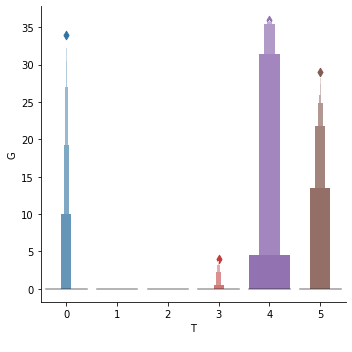

In [342]:
sns.catplot(x = "T\n", y = "G", kind = "boxen", data = Data.sort_values("N"))

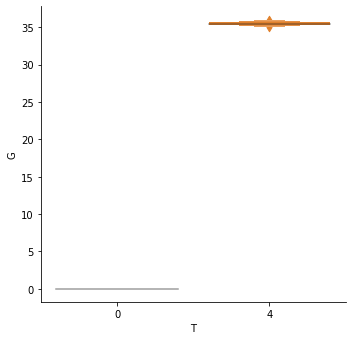

In [343]:
sns.catplot(x = "T\n", y = "G", kind = "boxen", data = A.sort_values("N"))

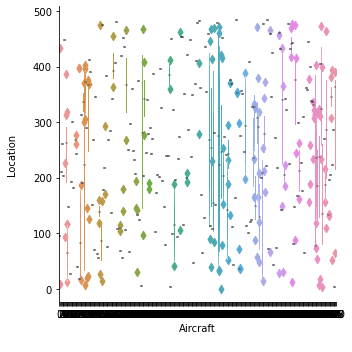

In [344]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = Data.sort_values("Date\n"))

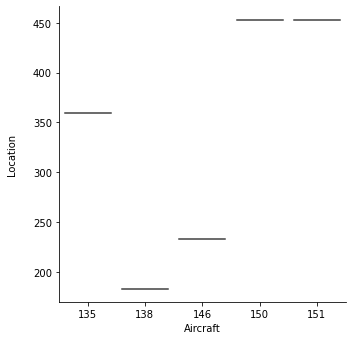

In [345]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = A.sort_values("Date\n"))

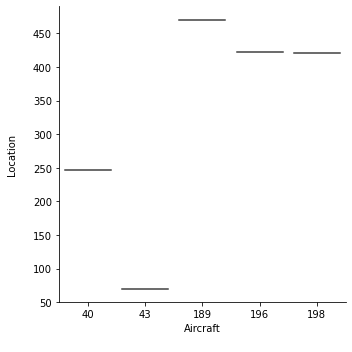

In [346]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = B.sort_values("Date\n"))

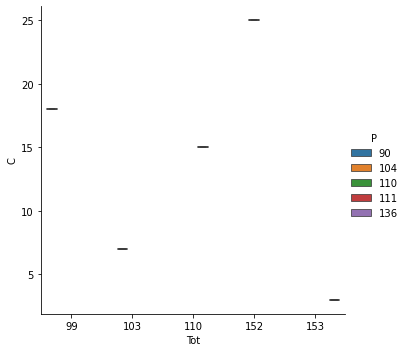

In [347]:
sns.catplot(x = "Tot", y = "C", hue = "P", kind = "box", data = A)

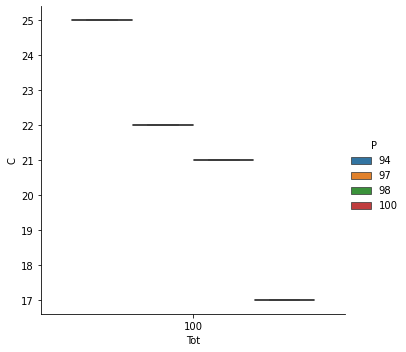

In [348]:
sns.catplot(x = "Tot", y = "C", hue = "P", kind = "box", data = B)

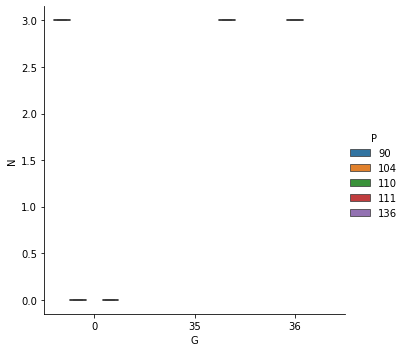

In [349]:
sns.catplot(x = "G", y = "N", hue = "P", kind = "box", data = A)

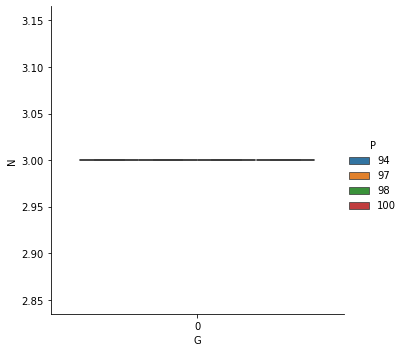

In [350]:
sns.catplot(x = "G", y = "N", hue = "P", kind = "box", data = B)

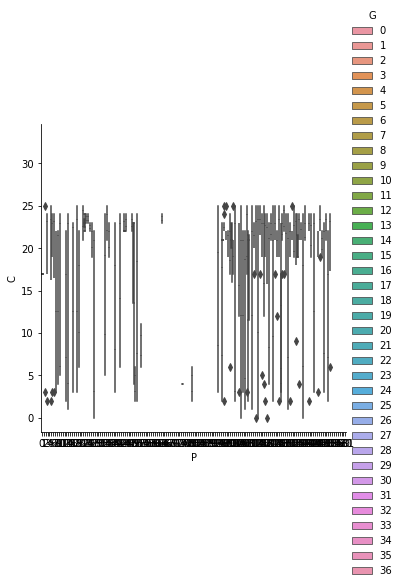

In [351]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = Data)

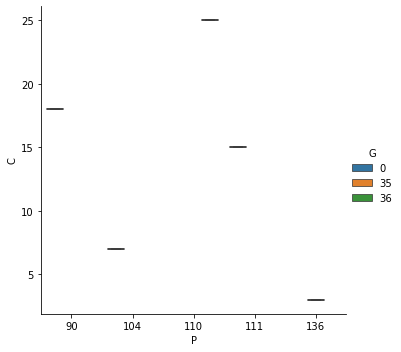

In [352]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = A)

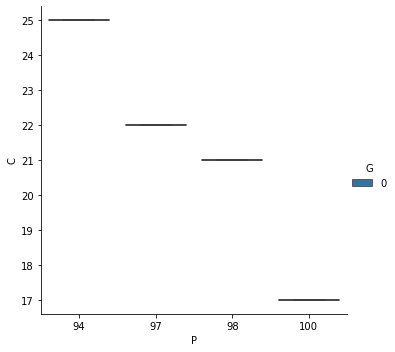

In [353]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = B)

## OBSERVATION: 

Incident is high with Iranian Air Force (5-8519), Aircraft:- Lockheed C-130E Hercules: 84 Passengers(P), 10 Crew(C), were dead by Military (T:MIL - accident/incident) on Approach(Phase) of 5.5 km (3.4 mi) on 06-12-2005(Date) at Tehran, Iran(Location).

## Observation of Boxen Plot:

1. OUTLIERS: An outlier is an observation that is numerically distant from the rest of the data. Box plots are useful as they show outliers within a data set. When reviewing a box plot, an outlier is defined as a data point that is located outside the whiskers of the box plot.

2. Comparision of the medians, the interquartile ranges and whiskers of box plots.

3. Gives the potential outliers and signs of Skewness.

## PAIR PLOT: Pair Plots are a really simple (one-line-of-code simple!) way to visualize relationships between each variable. It produces a matrix of relationships between each variable in your data for an instant examination of our data. It can also be a great jumping off point for determining types of regression analysis to use. It's a pairwise relationships in a dataset. The pairplot function creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column.

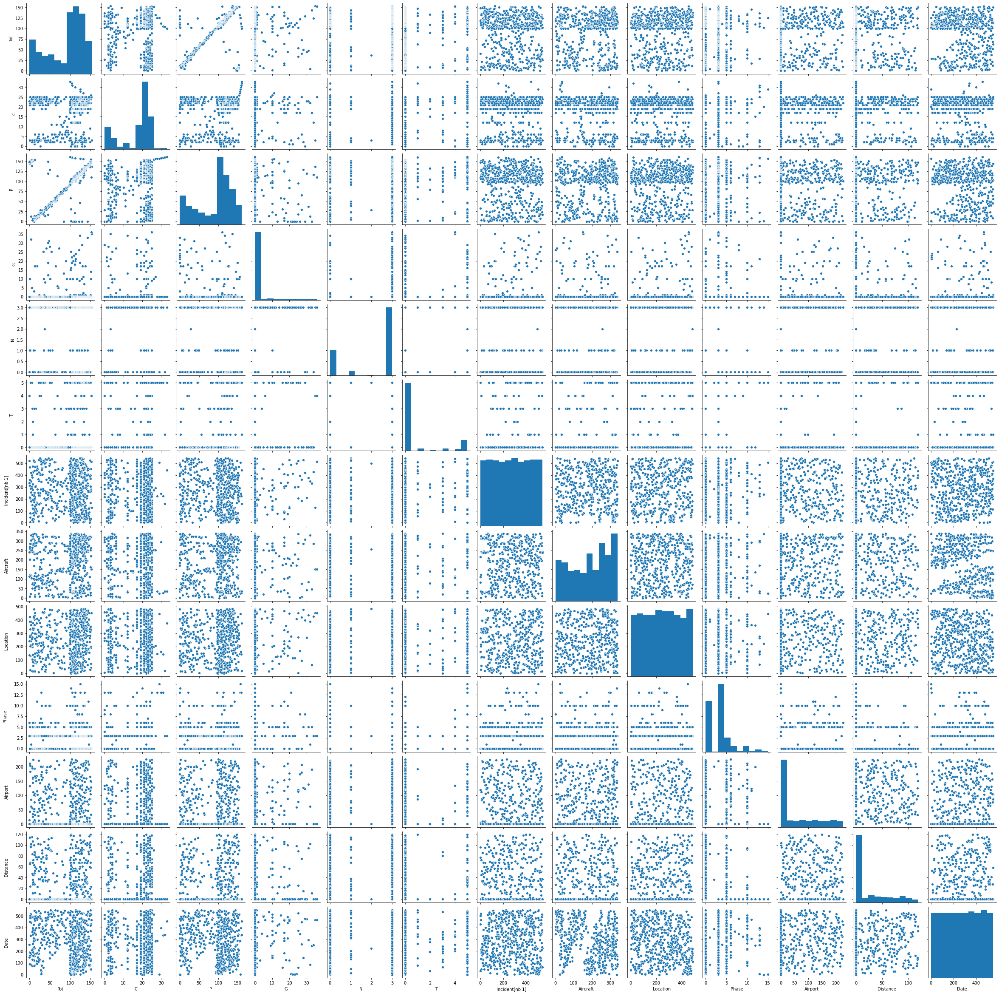

In [354]:
sns.pairplot(Data)

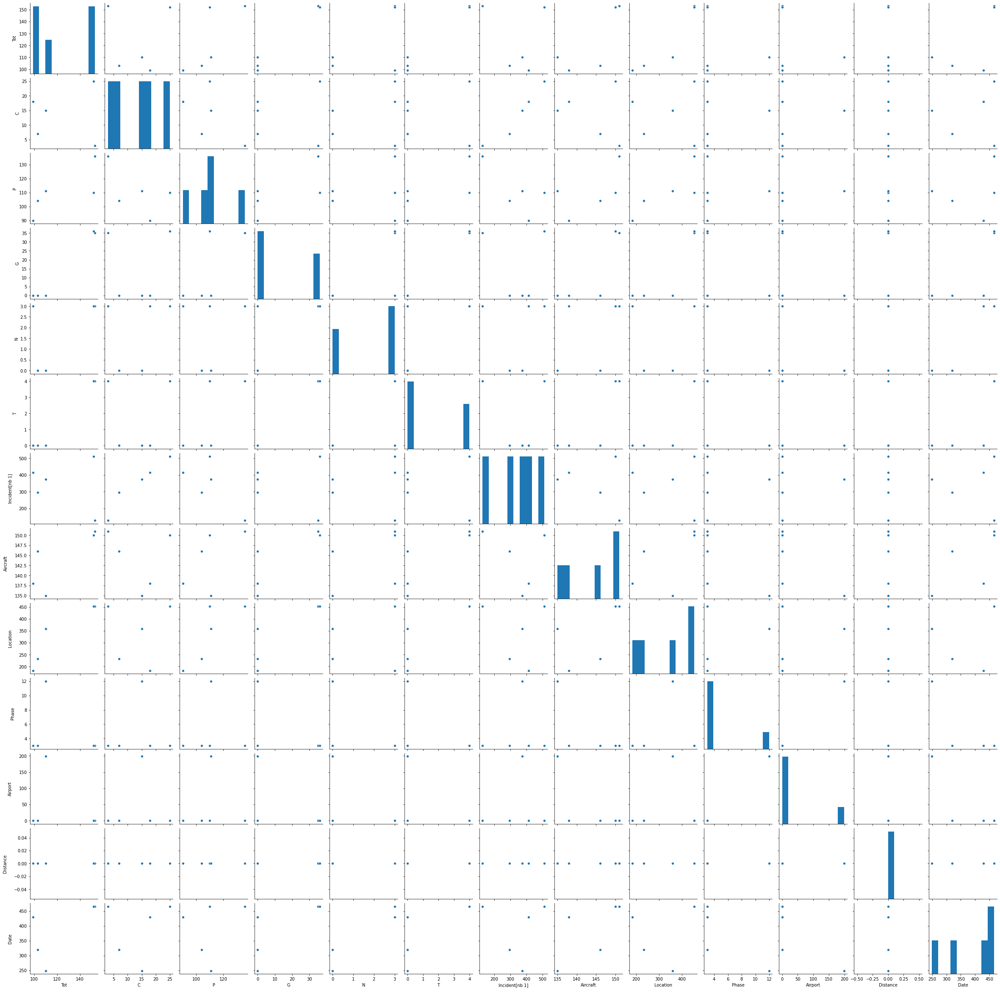

In [355]:
sns.pairplot(A)

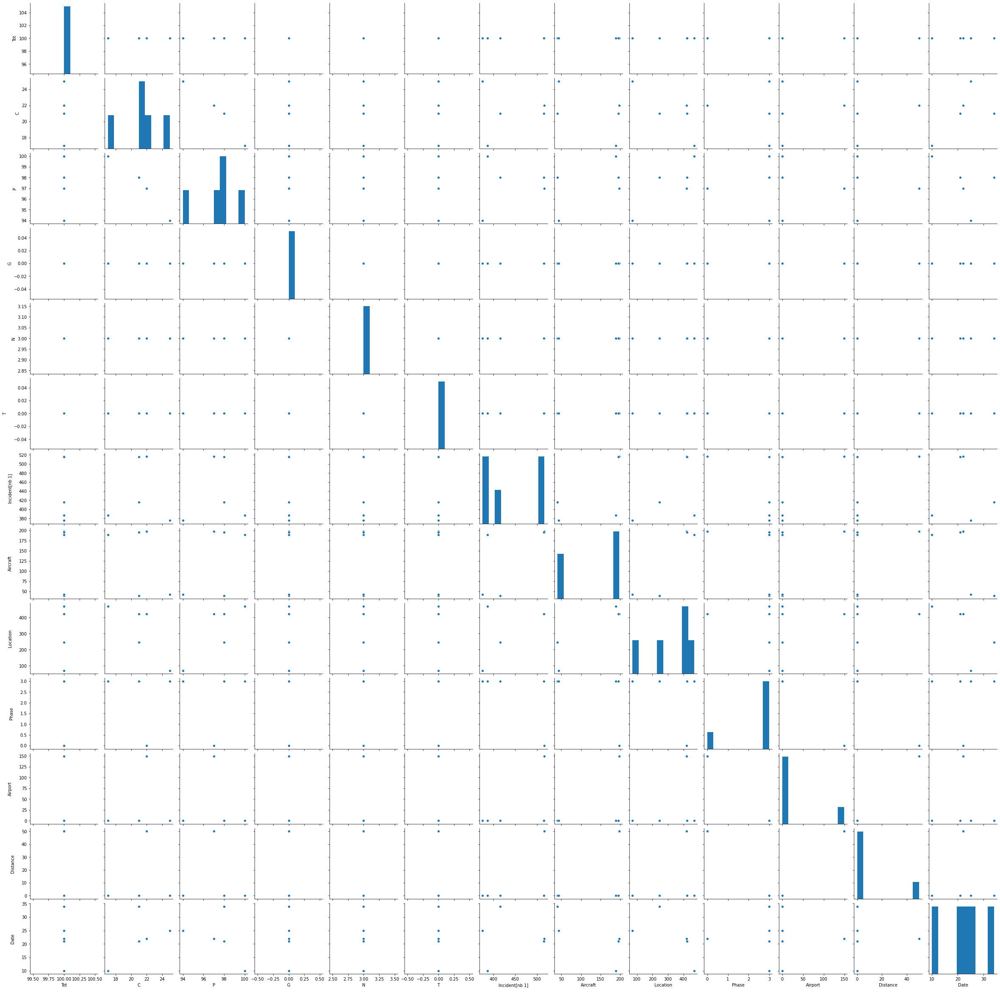

In [356]:
sns.pairplot(B)

## Observation of Pair Plot:

1. Pairs plots are a powerful tool to quickly explore distributions and relationships in a dataset.

2. The diagonal plots are kernel density plots where the other plots are scatter plots.

## FINAL CONCLUSION

Incident with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location) are more as per the graphical representation.	

## INCIDENT :

1. The incidents are more with the Commercial (accident/incident) with huge deaths.

2. The incidents are less with the Military (accident/incident), Bombing, Hijacking (accident/incident) with huge deaths. 

## PHASE :

1. For a Huge period - accidents were done during the En-route(ENR).

2. In some cases - accidents were done during the Approach(APR).

## DEATH COMPARISION :

1. The death of Passengers(P) were huge when compared to the Crew(C) in the Cabin.

2. Rough Estimation is around 1,700.